In [1]:
from matplotlib import pyplot as plt
import matplotlib as mpl
import numpy as np
from tqdm import tqdm
import os
plt.style.use('/projects/DEIKE/jiarongw/jiarongw-postprocessing/media/matplotlib/stylelib/jfm.mplstyle')
# plt.style.use('/projects/DEIKE/jiarongw/jiarongw-postprocessing/media/matplotlib/stylelib/pof.mplstyle')
from prepare import load_object, save_object
from defs import Case, Interface2D
from phase import extract_phase
from prepare import read_p, read_fields


## Summary:
This notebook computes the second order statistics of the turbulent boundary layer flow from the sliced field (as opposed to the prof files in the other notebook). Some of the stats (Reynolds stress) requires the full 3D flow field and therefore can't be simply reloaded from the case pickles.
## <a class="anchor" id="0">Table of content: </a> 

#### [1. Read-ins and preps](#1)
#### [2. Mean velocity profiles](#2)
#### [3. Wave stress and Reynolds stress](#3)
#### [4. Rms velocity (TODO)](#4)

### <a class="anchor" id="1">Read-ins and preps</a>

In [65]:
""" Read in: can be replaced by using the kernel of Readin 
    ak = 0.15 cases and precursor """

case1 = Case(ustar=0.25, Retau=720, Bo=200, g=1, ak=0.15, LEVEL=10, emax=0.3, alterMU=16, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_boundary_')
case1.tstart = 44
case2 = Case(ustar=0.25, Retau=720, Bo=200, g=4, ak=0.15, LEVEL=10, emax=0.3, alterMU=8, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_boundary_')
case2.tstart = 44
case3 = Case(ustar=0.25, Retau=720, Bo=200, g=16, ak=0.15, LEVEL=10, emax=0.3, alterMU=4, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_boundary_')
case3.tstart = 44
case_pre1 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.15, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_precursor_')
case_pre1.tstart = 33

case = case1
case.tsimu = np.arange(44.1,66,0.1)
extract_phase(case, case.tsimu)
case = case2
case.tsimu = np.arange(44.1,62.1,0.1)
extract_phase(case, case.tsimu)
case = case3
case.tsimu = np.arange(44.1,58.1,0.1)
extract_phase(case, case.tsimu)
case = case_pre1
case.tsimu = np.arange(33.1,43.1,0.1)
extract_phase(case, case.tsimu, PRE=True)


/projects/DEIKE/jiarongw/turbulence/rerun/curved_fixREtau_boundary_REtau720_BO200_g1_ak0.15_MU16_LEVEL10_emax0.3/
mu1 = 7.67063e-06, rho1 = 1, mu2 = 2.24719e-06, rho2 = 0.001225, sigma = 0.0003125
Given k = 4 (1/m), calculated omega = 2.00499 (1/s), period = 3.13377 (s), phase speed c = 0.501248 (m/s), wavelength = 1.5708 (m), Bo = 200
g = 1, c = 0.501248, Ustar = 0.25, MURATIO = 0.29296, mu_w = 7.67063e-06, rho_w = 1, mu_a = 2.24719e-06, rho_a = 0.001225, sigma = 0.0003125, Bo = 200, RE = 102646, Re_tau = 720
RELEASETIME = 44, uemax = 0.075 

/projects/DEIKE/jiarongw/turbulence/rerun/curved_fixREtau_boundary_REtau720_BO200_g4_ak0.15_MU8_LEVEL10_emax0.3/
mu1 = 1.53413e-05, rho1 = 1, mu2 = 2.24719e-06, rho2 = 0.001225, sigma = 0.00125
Given k = 4 (1/m), calculated omega = 4.00999 (1/s), period = 1.56688 (s), phase speed c = 1.0025 (m/s), wavelength = 1.5708 (m), Bo = 200
g = 4, c = 1.0025, Ustar = 0.25, MURATIO = 0.14648, mu_w = 1.53413e-05, rho_w = 1, mu_a = 2.24719e-06, rho_a = 0.0012

In [2]:
""" Read in: can be replaced by using the kernel of Readin 
    ak = 0.2 cases and precursor """

case4 = Case(ustar=0.25, Retau=720, Bo=200, g=1, ak=0.2, LEVEL=10, emax=0.3, alterMU=16, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_boundary_')
case4.tstart = 57
case5 = Case(ustar=0.25, Retau=720, Bo=200, g=4, ak=0.2, LEVEL=10, emax=0.3, alterMU=8, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_boundary_')
case5.tstart = 57
case6 = Case(ustar=0.25, Retau=720, Bo=200, g=16, ak=0.2, LEVEL=10, emax=0.3, alterMU=4, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_boundary_')
case6.tstart = 57
case_pre2 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.2, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre2.tstart = 53
case_pre2_new = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.2, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_precursor_')
case_pre2_new.tstart = 33

case = case4
case.tsimu = np.arange(58,108,1)
extract_phase(case, case.tsimu)
case = case5
case.tsimu = np.arange(58,101,1)
extract_phase(case, case.tsimu)
case = case6
case.tsimu = np.arange(58,73,1)
extract_phase(case, case.tsimu)

case = case_pre2
case.tsimu = np.arange(53,64,1)
extract_phase(case, case.tsimu, PRE=True)
case = case_pre2_new
case.tsimu = np.arange(33,38.5,0.1)
extract_phase(case, case.tsimu, PRE=True)

/projects/DEIKE/jiarongw/turbulence/curved_fixREtau_boundary_REtau720_BO200_g1_ak0.2_MU16_LEVEL10_emax0.3/
mu1 = 7.67063e-06, rho1 = 1, mu2 = 2.24719e-06, rho2 = 0.001225, sigma = 0.0003125
Given k = 4 (1/m), calculated omega = 2.00499 (1/s), period = 3.13377 (s), phase speed c = 0.501248 (m/s), wavelength = 1.5708 (m), Bo = 200
g = 1, c = 0.501248, Ustar = 0.25, MURATIO = 0.01831, mu_w = 7.67063e-06, rho_w = 1, mu_a = 2.24719e-06, rho_a = 0.001225, sigma = 0.0003125, Bo = 200, RE = 102646, Re_tau = 720
RELEASETIME = 57, uemax = 0.075 
tiger-h19c2n6.28240Exhausted 1048576 MQ irecv request descriptors, which usually indicates a user program error or insufficient request descriptors (PSM2_MQ_RECVREQS_MAX=1048576)
srun: Job step aborted: Waiting up to 47 seconds for job step to finish.
slurmstepd: error: *** STEP 7188585.0 ON tiger-h19c2n6 CANCELLED AT 2021-09-21T01:12:00 DUE TO TIME LIMIT ***
[warn] Epoll ADD(4) on fd 42 failed.  Old events were 0; read change was 0 (none); write change 

In [66]:
""" Field: ak=0.15 """
case = case1
case.field_t = np.arange(44.5,66,0.5) - case.tstart
read_fields(case)

case = case2
case.field_t = np.arange(44.5,62.5,0.5) - case.tstart
read_fields(case)

case = case3
case.field_t = np.arange(44.5,58.5,0.5) - case.tstart
read_fields(case)

case = case_pre1
case.field_t = np.arange(33.5,43.5,0.5) - case.tstart
read_fields(case)

  0%|          | 0/43 [00:00<?, ?it/s]

44.5
pickle restored!
pickle restored!
pickle restored!


  2%|▏         | 1/43 [00:01<01:22,  1.97s/it]

45.0
pickle restored!
pickle restored!
pickle restored!


  5%|▍         | 2/43 [00:03<01:21,  1.98s/it]

45.5
pickle restored!
pickle restored!
pickle restored!


  7%|▋         | 3/43 [00:05<01:18,  1.96s/it]

46.0
pickle restored!
pickle restored!
pickle restored!


  9%|▉         | 4/43 [00:07<01:16,  1.96s/it]

46.5
pickle restored!
pickle restored!
pickle restored!


 12%|█▏        | 5/43 [00:09<01:14,  1.95s/it]

47.0
pickle restored!
pickle restored!
pickle restored!


 14%|█▍        | 6/43 [00:11<01:12,  1.95s/it]

47.5
pickle restored!
pickle restored!
pickle restored!


 16%|█▋        | 7/43 [00:13<01:09,  1.94s/it]

48.0
pickle restored!
pickle restored!
pickle restored!


 19%|█▊        | 8/43 [00:15<01:07,  1.94s/it]

48.5
pickle restored!
pickle restored!
pickle restored!


 21%|██        | 9/43 [00:17<01:06,  1.95s/it]

49.0
pickle restored!
pickle restored!
pickle restored!


 23%|██▎       | 10/43 [00:19<01:04,  1.94s/it]

49.5
pickle restored!
pickle restored!
pickle restored!


 26%|██▌       | 11/43 [00:21<01:02,  1.95s/it]

50.0
pickle restored!
pickle restored!
pickle restored!


 28%|██▊       | 12/43 [00:23<01:01,  1.98s/it]

50.5
pickle restored!
pickle restored!
pickle restored!


 30%|███       | 13/43 [00:25<00:59,  1.99s/it]

51.0
pickle restored!
pickle restored!
pickle restored!


 33%|███▎      | 14/43 [00:27<00:57,  2.00s/it]

51.5
pickle restored!
pickle restored!
pickle restored!


 35%|███▍      | 15/43 [00:29<00:55,  2.00s/it]

52.0
pickle restored!
pickle restored!
pickle restored!


 37%|███▋      | 16/43 [00:31<00:54,  2.03s/it]

52.5
pickle restored!
pickle restored!
pickle restored!


 40%|███▉      | 17/43 [00:33<00:54,  2.10s/it]

53.0
pickle restored!
pickle restored!
pickle restored!


 42%|████▏     | 18/43 [00:36<00:53,  2.15s/it]

53.5
pickle restored!
pickle restored!
pickle restored!


 44%|████▍     | 19/43 [00:38<00:50,  2.12s/it]

54.0
pickle restored!
pickle restored!
pickle restored!


 47%|████▋     | 20/43 [00:40<00:49,  2.17s/it]

54.5
pickle restored!
pickle restored!
pickle restored!


 49%|████▉     | 21/43 [00:42<00:47,  2.18s/it]

55.0
pickle restored!
pickle restored!
pickle restored!


 51%|█████     | 22/43 [00:44<00:45,  2.16s/it]

55.5
pickle restored!
pickle restored!
pickle restored!


 53%|█████▎    | 23/43 [00:47<00:43,  2.18s/it]

56.0
pickle restored!
pickle restored!
pickle restored!


 56%|█████▌    | 24/43 [00:49<00:41,  2.19s/it]

56.5
pickle restored!
pickle restored!
pickle restored!


 58%|█████▊    | 25/43 [00:51<00:38,  2.14s/it]

57.0
pickle restored!
pickle restored!
pickle restored!


 60%|██████    | 26/43 [00:53<00:37,  2.20s/it]

57.5
pickle restored!
pickle restored!
pickle restored!


 63%|██████▎   | 27/43 [00:55<00:35,  2.20s/it]

58.0
pickle restored!
pickle restored!
pickle restored!


 65%|██████▌   | 28/43 [00:58<00:33,  2.25s/it]

58.5
pickle restored!
pickle restored!
pickle restored!


 67%|██████▋   | 29/43 [01:00<00:31,  2.22s/it]

59.0
pickle restored!
pickle restored!
pickle restored!


 70%|██████▉   | 30/43 [01:02<00:28,  2.18s/it]

59.5
pickle restored!
pickle restored!
pickle restored!


 72%|███████▏  | 31/43 [01:04<00:25,  2.15s/it]

60.0
pickle restored!
pickle restored!
pickle restored!


 74%|███████▍  | 32/43 [01:06<00:23,  2.16s/it]

60.5
pickle restored!
pickle restored!
pickle restored!


 77%|███████▋  | 33/43 [01:08<00:21,  2.14s/it]

61.0
pickle restored!
pickle restored!
pickle restored!


 79%|███████▉  | 34/43 [01:11<00:20,  2.23s/it]

61.5
pickle restored!
pickle restored!
pickle restored!


 81%|████████▏ | 35/43 [01:13<00:17,  2.22s/it]

62.0
pickle restored!
pickle restored!
pickle restored!


 84%|████████▎ | 36/43 [01:15<00:15,  2.22s/it]

62.5
pickle restored!
pickle restored!
pickle restored!


 86%|████████▌ | 37/43 [01:17<00:13,  2.20s/it]

63.0
pickle restored!
pickle restored!
pickle restored!


 88%|████████▊ | 38/43 [01:19<00:10,  2.18s/it]

63.5
pickle restored!
pickle restored!
pickle restored!


 91%|█████████ | 39/43 [01:22<00:08,  2.17s/it]

64.0
pickle restored!
pickle restored!
pickle restored!


 93%|█████████▎| 40/43 [01:24<00:06,  2.15s/it]

64.5
pickle restored!
pickle restored!
pickle restored!


 95%|█████████▌| 41/43 [01:26<00:04,  2.17s/it]

65.0
pickle restored!
pickle restored!
pickle restored!


 98%|█████████▊| 42/43 [01:28<00:02,  2.21s/it]

65.5
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/36 [00:00<?, ?it/s]

44.5
pickle restored!
pickle restored!
pickle restored!


  3%|▎         | 1/36 [00:02<01:25,  2.45s/it]

45.0
pickle restored!
pickle restored!
pickle restored!


  6%|▌         | 2/36 [00:04<01:15,  2.21s/it]

45.5
pickle restored!
pickle restored!
pickle restored!


  8%|▊         | 3/36 [00:06<01:10,  2.15s/it]

46.0
pickle restored!
pickle restored!
pickle restored!


 11%|█         | 4/36 [00:08<01:08,  2.16s/it]

46.5
pickle restored!
pickle restored!
pickle restored!


 14%|█▍        | 5/36 [00:10<01:05,  2.12s/it]

47.0
pickle restored!
pickle restored!
pickle restored!


 17%|█▋        | 6/36 [00:12<01:02,  2.09s/it]

47.5
pickle restored!
pickle restored!
pickle restored!


 19%|█▉        | 7/36 [00:14<01:01,  2.11s/it]

48.0
pickle restored!
pickle restored!
pickle restored!


 22%|██▏       | 8/36 [00:17<00:59,  2.12s/it]

48.5
pickle restored!
pickle restored!
pickle restored!


 25%|██▌       | 9/36 [00:19<00:56,  2.10s/it]

49.0
pickle restored!
pickle restored!
pickle restored!


 28%|██▊       | 10/36 [00:21<00:54,  2.10s/it]

49.5
pickle restored!
pickle restored!
pickle restored!


 31%|███       | 11/36 [00:23<00:53,  2.14s/it]

50.0
pickle restored!
pickle restored!
pickle restored!


 33%|███▎      | 12/36 [00:25<00:52,  2.17s/it]

50.5
pickle restored!
pickle restored!
pickle restored!


 36%|███▌      | 13/36 [00:27<00:49,  2.15s/it]

51.0
pickle restored!
pickle restored!
pickle restored!


 39%|███▉      | 14/36 [00:30<00:47,  2.17s/it]

51.5
pickle restored!
pickle restored!
pickle restored!


 42%|████▏     | 15/36 [00:32<00:44,  2.11s/it]

52.0
pickle restored!
pickle restored!
pickle restored!


 44%|████▍     | 16/36 [00:34<00:41,  2.09s/it]

52.5
pickle restored!
pickle restored!
pickle restored!


 47%|████▋     | 17/36 [00:36<00:39,  2.06s/it]

53.0
pickle restored!
pickle restored!
pickle restored!


 50%|█████     | 18/36 [00:38<00:36,  2.02s/it]

53.5
pickle restored!
pickle restored!
pickle restored!


 53%|█████▎    | 19/36 [00:39<00:34,  2.01s/it]

54.0
pickle restored!
pickle restored!
pickle restored!


 56%|█████▌    | 20/36 [00:42<00:32,  2.04s/it]

54.5
pickle restored!
pickle restored!
pickle restored!


 58%|█████▊    | 21/36 [00:44<00:30,  2.05s/it]

55.0
pickle restored!
pickle restored!
pickle restored!


 61%|██████    | 22/36 [00:46<00:28,  2.05s/it]

55.5
pickle restored!
pickle restored!
pickle restored!


 64%|██████▍   | 23/36 [00:48<00:26,  2.02s/it]

56.0
pickle restored!
pickle restored!
pickle restored!


 67%|██████▋   | 24/36 [00:50<00:24,  2.00s/it]

56.5
pickle restored!
pickle restored!
pickle restored!


 69%|██████▉   | 25/36 [00:52<00:22,  2.03s/it]

57.0
pickle restored!
pickle restored!
pickle restored!


 72%|███████▏  | 26/36 [00:54<00:20,  2.00s/it]

57.5
pickle restored!
pickle restored!
pickle restored!


 75%|███████▌  | 27/36 [00:56<00:18,  2.03s/it]

58.0
pickle restored!
pickle restored!
pickle restored!


 78%|███████▊  | 28/36 [00:58<00:16,  2.01s/it]

58.5
pickle restored!
pickle restored!
pickle restored!


 81%|████████  | 29/36 [01:00<00:14,  2.01s/it]

59.0
pickle restored!
pickle restored!
pickle restored!


 83%|████████▎ | 30/36 [01:02<00:12,  2.01s/it]

59.5
pickle restored!
pickle restored!
pickle restored!


 86%|████████▌ | 31/36 [01:04<00:10,  2.15s/it]

60.0
pickle restored!
pickle restored!
pickle restored!


 89%|████████▉ | 32/36 [01:06<00:08,  2.12s/it]

60.5
pickle restored!
pickle restored!
pickle restored!


 92%|█████████▏| 33/36 [01:08<00:06,  2.07s/it]

61.0
pickle restored!
pickle restored!
pickle restored!


 94%|█████████▍| 34/36 [01:10<00:04,  2.05s/it]

61.5
pickle restored!
pickle restored!
pickle restored!


 97%|█████████▋| 35/36 [01:12<00:02,  2.03s/it]

62.0
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/28 [00:00<?, ?it/s]

44.5
pickle restored!
pickle restored!
pickle restored!


  4%|▎         | 1/28 [00:02<00:54,  2.01s/it]

45.0
pickle restored!
pickle restored!
pickle restored!


  7%|▋         | 2/28 [00:03<00:51,  2.00s/it]

45.5
pickle restored!
pickle restored!
pickle restored!


 11%|█         | 3/28 [00:05<00:49,  1.98s/it]

46.0
pickle restored!
pickle restored!
pickle restored!


 14%|█▍        | 4/28 [00:07<00:48,  2.00s/it]

46.5
pickle restored!
pickle restored!
pickle restored!


 18%|█▊        | 5/28 [00:09<00:45,  1.99s/it]

47.0
pickle restored!
pickle restored!
pickle restored!


 21%|██▏       | 6/28 [00:11<00:43,  1.96s/it]

47.5
pickle restored!
pickle restored!
pickle restored!


 25%|██▌       | 7/28 [00:13<00:41,  1.96s/it]

48.0
pickle restored!
pickle restored!
pickle restored!


 29%|██▊       | 8/28 [00:15<00:39,  1.96s/it]

48.5
pickle restored!
pickle restored!
pickle restored!


 32%|███▏      | 9/28 [00:17<00:37,  1.98s/it]

49.0
pickle restored!
pickle restored!
pickle restored!


 36%|███▌      | 10/28 [00:19<00:35,  1.96s/it]

49.5
pickle restored!
pickle restored!
pickle restored!


 39%|███▉      | 11/28 [00:22<00:37,  2.20s/it]

50.0
pickle restored!
pickle restored!
pickle restored!


 43%|████▎     | 12/28 [00:24<00:33,  2.12s/it]

50.5
pickle restored!
pickle restored!
pickle restored!


 46%|████▋     | 13/28 [00:26<00:31,  2.11s/it]

51.0
pickle restored!
pickle restored!
pickle restored!


 50%|█████     | 14/28 [00:28<00:29,  2.10s/it]

51.5
pickle restored!
pickle restored!
pickle restored!


 54%|█████▎    | 15/28 [00:30<00:26,  2.07s/it]

52.0
pickle restored!
pickle restored!
pickle restored!


 57%|█████▋    | 16/28 [00:32<00:24,  2.07s/it]

52.5
pickle restored!
pickle restored!
pickle restored!


 61%|██████    | 17/28 [00:34<00:22,  2.05s/it]

53.0
pickle restored!
pickle restored!
pickle restored!


 64%|██████▍   | 18/28 [00:36<00:20,  2.07s/it]

53.5
pickle restored!
pickle restored!
pickle restored!


 68%|██████▊   | 19/28 [00:38<00:18,  2.05s/it]

54.0
pickle restored!
pickle restored!
pickle restored!


 71%|███████▏  | 20/28 [00:40<00:16,  2.02s/it]

54.5
pickle restored!
pickle restored!
pickle restored!


 75%|███████▌  | 21/28 [00:42<00:14,  2.01s/it]

55.0
pickle restored!
pickle restored!
pickle restored!


 79%|███████▊  | 22/28 [00:44<00:11,  1.99s/it]

55.5
pickle restored!
pickle restored!
pickle restored!


 82%|████████▏ | 23/28 [00:46<00:10,  2.02s/it]

56.0
pickle restored!
pickle restored!
pickle restored!


 86%|████████▌ | 24/28 [00:49<00:08,  2.12s/it]

56.5
pickle restored!
pickle restored!
pickle restored!


 89%|████████▉ | 25/28 [00:51<00:06,  2.10s/it]

57.0
pickle restored!
pickle restored!
pickle restored!


 93%|█████████▎| 26/28 [00:53<00:04,  2.07s/it]

57.5
pickle restored!
pickle restored!
pickle restored!


 96%|█████████▋| 27/28 [00:55<00:02,  2.10s/it]

58.0
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/20 [00:00<?, ?it/s]

33.5
pickle restored!
pickle restored!
pickle restored!


  5%|▌         | 1/20 [00:02<00:38,  2.04s/it]

34.0
pickle restored!
pickle restored!
pickle restored!


 10%|█         | 2/20 [00:04<00:37,  2.08s/it]

34.5
pickle restored!
pickle restored!
pickle restored!


 15%|█▌        | 3/20 [00:06<00:35,  2.07s/it]

35.0
pickle restored!
pickle restored!
pickle restored!


 20%|██        | 4/20 [00:08<00:32,  2.03s/it]

35.5
pickle restored!
pickle restored!
pickle restored!


 25%|██▌       | 5/20 [00:10<00:32,  2.16s/it]

36.0
pickle restored!
pickle restored!
pickle restored!


 30%|███       | 6/20 [00:12<00:29,  2.11s/it]

36.5
pickle restored!
pickle restored!
pickle restored!


 35%|███▌      | 7/20 [00:14<00:27,  2.14s/it]

37.0
pickle restored!
pickle restored!
pickle restored!


 40%|████      | 8/20 [00:16<00:25,  2.09s/it]

37.5
pickle restored!
pickle restored!
pickle restored!


 45%|████▌     | 9/20 [00:18<00:22,  2.06s/it]

38.0
pickle restored!
pickle restored!
pickle restored!


 50%|█████     | 10/20 [00:20<00:20,  2.06s/it]

38.5
pickle restored!
pickle restored!
pickle restored!


 55%|█████▌    | 11/20 [00:22<00:18,  2.06s/it]

39.0
pickle restored!
pickle restored!
pickle restored!


 60%|██████    | 12/20 [00:24<00:16,  2.03s/it]

39.5
pickle restored!
pickle restored!
pickle restored!


 65%|██████▌   | 13/20 [00:26<00:13,  1.98s/it]

40.0
pickle restored!
pickle restored!
pickle restored!


 70%|███████   | 14/20 [00:28<00:11,  1.98s/it]

40.5
pickle restored!
pickle restored!
pickle restored!


 75%|███████▌  | 15/20 [00:30<00:09,  1.96s/it]

41.0
pickle restored!
pickle restored!
pickle restored!


 80%|████████  | 16/20 [00:32<00:07,  1.98s/it]

41.5
pickle restored!
pickle restored!
pickle restored!


 85%|████████▌ | 17/20 [00:34<00:05,  1.95s/it]

42.0
pickle restored!
pickle restored!
pickle restored!


 90%|█████████ | 18/20 [00:36<00:03,  1.96s/it]

42.5
pickle restored!
pickle restored!
pickle restored!


 95%|█████████▌| 19/20 [00:38<00:01,  1.96s/it]

43.0
pickle restored!
pickle restored!
pickle restored!


100%|██████████| 20/20 [00:40<00:00,  2.03s/it]


In [3]:
""" Field: ak=0.2 """
for case in (case4,case5,case6,case_pre2):
    case.field_t = case.phase['t']
    read_fields(case)
    
case = case_pre2_new
case.field_t = np.arange(33,38.5,0.5) - case.tstart
read_fields(case)

  0%|          | 0/50 [00:00<?, ?it/s]

58
pickle restored!
pickle restored!
pickle restored!


  2%|▏         | 1/50 [00:01<01:37,  1.99s/it]

59
pickle restored!
pickle restored!
pickle restored!


  4%|▍         | 2/50 [00:03<01:33,  1.95s/it]

60
pickle restored!
pickle restored!
pickle restored!


  6%|▌         | 3/50 [00:05<01:30,  1.93s/it]

61
pickle restored!
pickle restored!
pickle restored!


  8%|▊         | 4/50 [00:07<01:28,  1.93s/it]

62
pickle restored!
pickle restored!
pickle restored!


 10%|█         | 5/50 [00:09<01:26,  1.92s/it]

63
pickle restored!
pickle restored!
pickle restored!


 12%|█▏        | 6/50 [00:11<01:26,  1.96s/it]

64
pickle restored!
pickle restored!
pickle restored!


 14%|█▍        | 7/50 [00:13<01:23,  1.95s/it]

65
pickle restored!
pickle restored!
pickle restored!


 16%|█▌        | 8/50 [00:15<01:21,  1.95s/it]

66
pickle restored!
pickle restored!
pickle restored!


 18%|█▊        | 9/50 [00:17<01:19,  1.95s/it]

67
pickle restored!
pickle restored!
pickle restored!


 20%|██        | 10/50 [00:19<01:18,  1.95s/it]

68
pickle restored!
pickle restored!
pickle restored!


 22%|██▏       | 11/50 [00:21<01:15,  1.94s/it]

69
pickle restored!
pickle restored!
pickle restored!


 24%|██▍       | 12/50 [00:23<01:13,  1.93s/it]

70
pickle restored!
pickle restored!
pickle restored!


 26%|██▌       | 13/50 [00:25<01:10,  1.92s/it]

71
pickle restored!
pickle restored!
pickle restored!


 28%|██▊       | 14/50 [00:27<01:08,  1.90s/it]

72
pickle restored!
pickle restored!
pickle restored!


 30%|███       | 15/50 [00:28<01:06,  1.90s/it]

73
pickle restored!
pickle restored!
pickle restored!


 32%|███▏      | 16/50 [00:30<01:04,  1.89s/it]

74
pickle restored!
pickle restored!
pickle restored!


 34%|███▍      | 17/50 [00:32<01:02,  1.90s/it]

75
pickle restored!
pickle restored!
pickle restored!


 36%|███▌      | 18/50 [00:34<01:00,  1.90s/it]

76
pickle restored!
pickle restored!
pickle restored!


 38%|███▊      | 19/50 [00:36<00:58,  1.90s/it]

77
pickle restored!
pickle restored!
pickle restored!


 40%|████      | 20/50 [00:38<00:56,  1.89s/it]

78
pickle restored!
pickle restored!
pickle restored!


 42%|████▏     | 21/50 [00:40<00:54,  1.89s/it]

79
pickle restored!
pickle restored!
pickle restored!


 44%|████▍     | 22/50 [00:42<00:52,  1.88s/it]

80
pickle restored!
pickle restored!
pickle restored!


 46%|████▌     | 23/50 [00:44<00:51,  1.89s/it]

81
pickle restored!
pickle restored!
pickle restored!


 48%|████▊     | 24/50 [00:45<00:49,  1.90s/it]

82
pickle restored!
pickle restored!
pickle restored!


 50%|█████     | 25/50 [00:47<00:47,  1.89s/it]

83
pickle restored!
pickle restored!
pickle restored!


 52%|█████▏    | 26/50 [00:49<00:45,  1.91s/it]

84
pickle restored!
pickle restored!
pickle restored!


 54%|█████▍    | 27/50 [00:51<00:43,  1.90s/it]

85
pickle restored!
pickle restored!
pickle restored!


 56%|█████▌    | 28/50 [00:53<00:41,  1.89s/it]

86
pickle restored!
pickle restored!
pickle restored!


 58%|█████▊    | 29/50 [00:55<00:39,  1.88s/it]

87
pickle restored!
pickle restored!
pickle restored!


 60%|██████    | 30/50 [00:57<00:37,  1.86s/it]

88
pickle restored!
pickle restored!
pickle restored!


 62%|██████▏   | 31/50 [00:59<00:35,  1.89s/it]

89
pickle restored!
pickle restored!
pickle restored!


 64%|██████▍   | 32/50 [01:00<00:33,  1.87s/it]

90
pickle restored!
pickle restored!
pickle restored!


 66%|██████▌   | 33/50 [01:02<00:31,  1.84s/it]

91
pickle restored!
pickle restored!
pickle restored!


 68%|██████▊   | 34/50 [01:04<00:29,  1.84s/it]

92
pickle restored!
pickle restored!
pickle restored!


 70%|███████   | 35/50 [01:06<00:27,  1.83s/it]

93
pickle restored!
pickle restored!
pickle restored!


 72%|███████▏  | 36/50 [01:08<00:25,  1.81s/it]

94
pickle restored!
pickle restored!
pickle restored!


 74%|███████▍  | 37/50 [01:10<00:23,  1.82s/it]

95
pickle restored!
pickle restored!
pickle restored!


 76%|███████▌  | 38/50 [01:11<00:21,  1.83s/it]

96
pickle restored!
pickle restored!
pickle restored!


 78%|███████▊  | 39/50 [01:13<00:20,  1.84s/it]

97
pickle restored!
pickle restored!
pickle restored!


 80%|████████  | 40/50 [01:22<00:38,  3.85s/it]

98
pickle restored!
pickle restored!
pickle restored!


 82%|████████▏ | 41/50 [01:24<00:29,  3.26s/it]

99
pickle restored!
pickle restored!
pickle restored!


 84%|████████▍ | 42/50 [01:26<00:22,  2.85s/it]

100
pickle restored!
pickle restored!
pickle restored!


 86%|████████▌ | 43/50 [01:27<00:17,  2.56s/it]

101
pickle restored!
pickle restored!
pickle restored!


 88%|████████▊ | 44/50 [01:29<00:14,  2.35s/it]

102
pickle restored!
pickle restored!
pickle restored!


 90%|█████████ | 45/50 [01:31<00:11,  2.21s/it]

103
pickle restored!
pickle restored!
pickle restored!


 92%|█████████▏| 46/50 [01:33<00:08,  2.13s/it]

104
pickle restored!
pickle restored!
pickle restored!


 94%|█████████▍| 47/50 [01:35<00:06,  2.09s/it]

105
pickle restored!
pickle restored!
pickle restored!


 96%|█████████▌| 48/50 [01:37<00:04,  2.06s/it]

106
pickle restored!
pickle restored!
pickle restored!


 98%|█████████▊| 49/50 [01:39<00:02,  2.02s/it]

107
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/43 [00:00<?, ?it/s]

58
pickle restored!
pickle restored!
pickle restored!


  2%|▏         | 1/43 [00:02<01:24,  2.01s/it]

59
pickle restored!
pickle restored!
pickle restored!


  5%|▍         | 2/43 [00:03<01:19,  1.95s/it]

60
pickle restored!
pickle restored!
pickle restored!


  7%|▋         | 3/43 [00:05<01:16,  1.92s/it]

61
pickle restored!
pickle restored!
pickle restored!


  9%|▉         | 4/43 [00:07<01:14,  1.92s/it]

62
pickle restored!
pickle restored!
pickle restored!


 12%|█▏        | 5/43 [00:10<01:22,  2.18s/it]

63
pickle restored!
pickle restored!
pickle restored!


 14%|█▍        | 6/43 [00:12<01:16,  2.08s/it]

64
pickle restored!
pickle restored!
pickle restored!


 16%|█▋        | 7/43 [00:14<01:12,  2.03s/it]

65
pickle restored!
pickle restored!
pickle restored!


 19%|█▊        | 8/43 [00:16<01:09,  1.98s/it]

66
pickle restored!
pickle restored!
pickle restored!


 21%|██        | 9/43 [00:17<01:06,  1.95s/it]

67
pickle restored!
pickle restored!
pickle restored!


 23%|██▎       | 10/43 [00:19<01:04,  1.94s/it]

68
pickle restored!
pickle restored!
pickle restored!


 26%|██▌       | 11/43 [00:21<01:01,  1.93s/it]

69
pickle restored!
pickle restored!
pickle restored!


 28%|██▊       | 12/43 [00:23<00:59,  1.92s/it]

70
pickle restored!
pickle restored!
pickle restored!


 30%|███       | 13/43 [00:25<00:57,  1.93s/it]

71
pickle restored!
pickle restored!
pickle restored!


 33%|███▎      | 14/43 [00:27<00:55,  1.92s/it]

72
pickle restored!
pickle restored!
pickle restored!


 35%|███▍      | 15/43 [00:29<00:53,  1.91s/it]

73
pickle restored!
pickle restored!
pickle restored!


 37%|███▋      | 16/43 [00:31<00:51,  1.91s/it]

74
pickle restored!
pickle restored!
pickle restored!


 40%|███▉      | 17/43 [00:33<00:49,  1.91s/it]

75
pickle restored!
pickle restored!
pickle restored!


 42%|████▏     | 18/43 [00:35<00:48,  1.94s/it]

76
pickle restored!
pickle restored!
pickle restored!


 44%|████▍     | 19/43 [00:37<00:46,  1.95s/it]

77
pickle restored!
pickle restored!
pickle restored!


 47%|████▋     | 20/43 [00:39<00:44,  1.94s/it]

78
pickle restored!
pickle restored!
pickle restored!


 49%|████▉     | 21/43 [00:41<00:42,  1.92s/it]

79
pickle restored!
pickle restored!
pickle restored!


 51%|█████     | 22/43 [00:42<00:40,  1.94s/it]

80
pickle restored!
pickle restored!
pickle restored!


 53%|█████▎    | 23/43 [00:44<00:38,  1.94s/it]

81
pickle restored!
pickle restored!
pickle restored!


 56%|█████▌    | 24/43 [00:46<00:36,  1.94s/it]

82
pickle restored!
pickle restored!
pickle restored!


 58%|█████▊    | 25/43 [00:48<00:34,  1.93s/it]

83
pickle restored!
pickle restored!
pickle restored!


 60%|██████    | 26/43 [00:50<00:32,  1.93s/it]

84
pickle restored!
pickle restored!
pickle restored!


 63%|██████▎   | 27/43 [00:52<00:30,  1.93s/it]

85
pickle restored!
pickle restored!
pickle restored!


 65%|██████▌   | 28/43 [00:54<00:29,  1.96s/it]

86
pickle restored!
pickle restored!
pickle restored!


 67%|██████▋   | 29/43 [00:56<00:27,  1.94s/it]

87
pickle restored!
pickle restored!
pickle restored!


 70%|██████▉   | 30/43 [00:58<00:24,  1.91s/it]

88
pickle restored!
pickle restored!
pickle restored!


 72%|███████▏  | 31/43 [01:00<00:22,  1.90s/it]

89
pickle restored!
pickle restored!
pickle restored!


 74%|███████▍  | 32/43 [01:02<00:20,  1.90s/it]

90
pickle restored!
pickle restored!
pickle restored!


 77%|███████▋  | 33/43 [01:04<00:18,  1.88s/it]

91
pickle restored!
pickle restored!
pickle restored!


 79%|███████▉  | 34/43 [01:05<00:16,  1.88s/it]

92
pickle restored!
pickle restored!
pickle restored!


 81%|████████▏ | 35/43 [01:07<00:15,  1.89s/it]

93
pickle restored!
pickle restored!
pickle restored!


 84%|████████▎ | 36/43 [01:09<00:13,  1.88s/it]

94
pickle restored!
pickle restored!
pickle restored!


 86%|████████▌ | 37/43 [01:11<00:11,  1.92s/it]

95
pickle restored!
pickle restored!
pickle restored!


 88%|████████▊ | 38/43 [01:13<00:09,  1.93s/it]

96
pickle restored!
pickle restored!
pickle restored!


 91%|█████████ | 39/43 [01:15<00:07,  1.92s/it]

97
pickle restored!
pickle restored!
pickle restored!


 93%|█████████▎| 40/43 [01:17<00:05,  1.92s/it]

98
pickle restored!
pickle restored!
pickle restored!


 95%|█████████▌| 41/43 [01:19<00:03,  1.93s/it]

99
pickle restored!
pickle restored!
pickle restored!


 98%|█████████▊| 42/43 [01:21<00:01,  1.91s/it]

100
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/15 [00:00<?, ?it/s]

58
pickle restored!
pickle restored!
pickle restored!


  7%|▋         | 1/15 [00:01<00:26,  1.91s/it]

59
pickle restored!
pickle restored!
pickle restored!


 13%|█▎        | 2/15 [00:03<00:24,  1.88s/it]

60
pickle restored!
pickle restored!
pickle restored!


 20%|██        | 3/15 [00:05<00:22,  1.90s/it]

61
pickle restored!
pickle restored!
pickle restored!


 27%|██▋       | 4/15 [00:07<00:20,  1.90s/it]

62
pickle restored!
pickle restored!
pickle restored!


 33%|███▎      | 5/15 [00:09<00:18,  1.90s/it]

63
pickle restored!
pickle restored!
pickle restored!


 40%|████      | 6/15 [00:11<00:17,  1.91s/it]

64
pickle restored!
pickle restored!
pickle restored!


 47%|████▋     | 7/15 [00:13<00:15,  1.94s/it]

65
pickle restored!
pickle restored!
pickle restored!


 53%|█████▎    | 8/15 [00:15<00:13,  1.94s/it]

66
pickle restored!
pickle restored!
pickle restored!


 60%|██████    | 9/15 [00:17<00:11,  1.95s/it]

67
pickle restored!
pickle restored!
pickle restored!


 67%|██████▋   | 10/15 [00:19<00:09,  1.96s/it]

68
pickle restored!
pickle restored!
pickle restored!


 73%|███████▎  | 11/15 [00:21<00:07,  1.97s/it]

69
pickle restored!
pickle restored!
pickle restored!


 80%|████████  | 12/15 [00:23<00:05,  1.96s/it]

70
pickle restored!
pickle restored!
pickle restored!


 87%|████████▋ | 13/15 [00:25<00:03,  1.96s/it]

71
pickle restored!
pickle restored!
pickle restored!


 93%|█████████▎| 14/15 [00:27<00:01,  1.95s/it]

72
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/11 [00:00<?, ?it/s]

53
pickle restored!
pickle restored!
pickle restored!


  9%|▉         | 1/11 [00:01<00:18,  1.89s/it]

54
pickle restored!
pickle restored!
pickle restored!


 18%|█▊        | 2/11 [00:03<00:16,  1.85s/it]

55
pickle restored!
pickle restored!
pickle restored!


 27%|██▋       | 3/11 [00:05<00:14,  1.83s/it]

56
pickle restored!
pickle restored!
pickle restored!


 36%|███▋      | 4/11 [00:07<00:12,  1.82s/it]

57
pickle restored!
pickle restored!
pickle restored!


 45%|████▌     | 5/11 [00:09<00:10,  1.82s/it]

58
pickle restored!
pickle restored!
pickle restored!


 55%|█████▍    | 6/11 [00:10<00:09,  1.82s/it]

59
pickle restored!
pickle restored!
pickle restored!


 64%|██████▎   | 7/11 [00:12<00:07,  1.81s/it]

60
pickle restored!
pickle restored!
pickle restored!


 73%|███████▎  | 8/11 [00:14<00:05,  1.81s/it]

61
pickle restored!
pickle restored!
pickle restored!


 82%|████████▏ | 9/11 [00:16<00:03,  1.82s/it]

62
pickle restored!
pickle restored!
pickle restored!


 91%|█████████ | 10/11 [00:18<00:01,  1.85s/it]

63
pickle restored!
pickle restored!
pickle restored!


  0%|          | 0/11 [00:00<?, ?it/s]

33.0
pickle restored!
pickle restored!
pickle restored!


  9%|▉         | 1/11 [00:01<00:19,  1.97s/it]

33.5
pickle restored!
pickle restored!
pickle restored!


 18%|█▊        | 2/11 [00:03<00:17,  1.91s/it]

34.0
pickle restored!
pickle restored!
pickle restored!


 27%|██▋       | 3/11 [00:05<00:14,  1.87s/it]

34.5
pickle restored!
pickle restored!
pickle restored!


 36%|███▋      | 4/11 [00:07<00:14,  2.03s/it]

35.0
pickle restored!
pickle restored!
pickle restored!


 45%|████▌     | 5/11 [00:10<00:12,  2.05s/it]

35.5
pickle restored!
pickle restored!
pickle restored!


 55%|█████▍    | 6/11 [00:11<00:09,  1.98s/it]

36.0
pickle restored!
pickle restored!
pickle restored!


 64%|██████▎   | 7/11 [00:13<00:07,  1.97s/it]

36.5
pickle restored!
pickle restored!
pickle restored!


 73%|███████▎  | 8/11 [00:15<00:05,  1.93s/it]

37.0
pickle restored!
pickle restored!
pickle restored!


 82%|████████▏ | 9/11 [00:17<00:03,  1.92s/it]

37.5
pickle restored!
pickle restored!
pickle restored!


 91%|█████████ | 10/11 [00:19<00:01,  1.90s/it]

38.0
pickle restored!
pickle restored!
pickle restored!


100%|██████████| 11/11 [00:21<00:00,  1.94s/it]


In [67]:
""" Pressure: ak=0.15 """
case = case1
case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
case.p['t'] = np.arange(44.6,66,0.2) - case.tstart
read_p(case)

case = case2
case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
case.p['t'] = np.arange(44.6,62.6,0.2) - case.tstart
read_p(case)

case = case3
case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
case.p['t'] = np.arange(44.6,58.4,0.2) - case.tstart
read_p(case)

case = case_pre1
case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
case.p['t'] = np.arange(33.6,43.4,0.2) - case.tstart
read_p(case)

  0%|          | 0/107 [00:00<?, ?it/s]

44.6
pickle restored!


  1%|          | 1/107 [00:00<01:12,  1.46it/s]

44.800000000000004
pickle restored!


  2%|▏         | 2/107 [00:01<01:09,  1.51it/s]

45.00000000000001
pickle restored!


  3%|▎         | 3/107 [00:02<01:11,  1.46it/s]

45.20000000000001
pickle restored!


  4%|▎         | 4/107 [00:02<01:08,  1.50it/s]

45.40000000000001
pickle restored!


  5%|▍         | 5/107 [00:03<01:07,  1.52it/s]

45.600000000000016
pickle restored!


  6%|▌         | 6/107 [00:03<01:05,  1.54it/s]

45.80000000000002
pickle restored!


  7%|▋         | 7/107 [00:04<01:03,  1.57it/s]

46.00000000000002
pickle restored!


  7%|▋         | 8/107 [00:05<01:03,  1.56it/s]

46.200000000000024
pickle restored!


  8%|▊         | 9/107 [00:05<01:03,  1.55it/s]

46.40000000000003
pickle restored!


  9%|▉         | 10/107 [00:06<01:02,  1.54it/s]

46.60000000000003
pickle restored!


 10%|█         | 11/107 [00:07<01:02,  1.54it/s]

46.80000000000003
pickle restored!


 11%|█         | 12/107 [00:07<01:01,  1.53it/s]

47.000000000000036
pickle restored!


 12%|█▏        | 13/107 [00:08<01:01,  1.54it/s]

47.20000000000004
pickle restored!


 13%|█▎        | 14/107 [00:09<00:59,  1.55it/s]

47.40000000000004
pickle restored!


 14%|█▍        | 15/107 [00:09<00:58,  1.56it/s]

47.600000000000044
pickle restored!


 15%|█▍        | 16/107 [00:10<00:58,  1.54it/s]

47.80000000000005
pickle restored!


 16%|█▌        | 17/107 [00:11<00:58,  1.54it/s]

48.00000000000005
pickle restored!


 17%|█▋        | 18/107 [00:11<00:56,  1.56it/s]

48.20000000000005
pickle restored!


 18%|█▊        | 19/107 [00:12<00:56,  1.56it/s]

48.400000000000055
pickle restored!


 19%|█▊        | 20/107 [00:12<00:56,  1.54it/s]

48.60000000000006
pickle restored!


 20%|█▉        | 21/107 [00:13<00:55,  1.56it/s]

48.80000000000006
pickle restored!


 21%|██        | 22/107 [00:14<00:55,  1.53it/s]

49.000000000000064
pickle restored!


 21%|██▏       | 23/107 [00:14<00:55,  1.52it/s]

49.20000000000007
pickle restored!


 22%|██▏       | 24/107 [00:15<00:54,  1.52it/s]

49.40000000000007
pickle restored!


 23%|██▎       | 25/107 [00:16<00:53,  1.54it/s]

49.60000000000007
pickle restored!


 24%|██▍       | 26/107 [00:16<00:52,  1.54it/s]

49.800000000000075
pickle restored!


 25%|██▌       | 27/107 [00:17<00:52,  1.53it/s]

50.00000000000008
pickle restored!


 26%|██▌       | 28/107 [00:18<00:51,  1.53it/s]

50.20000000000008
pickle restored!


 27%|██▋       | 29/107 [00:18<00:51,  1.53it/s]

50.400000000000084
pickle restored!


 28%|██▊       | 30/107 [00:19<00:50,  1.54it/s]

50.60000000000009
pickle restored!


 29%|██▉       | 31/107 [00:20<00:49,  1.53it/s]

50.80000000000009
pickle restored!


 30%|██▉       | 32/107 [00:20<00:49,  1.53it/s]

51.00000000000009
pickle restored!


 31%|███       | 33/107 [00:21<00:48,  1.51it/s]

51.200000000000095
pickle restored!


 32%|███▏      | 34/107 [00:22<00:47,  1.53it/s]

51.4000000000001
pickle restored!


 33%|███▎      | 35/107 [00:22<00:47,  1.50it/s]

51.6000000000001
pickle restored!


 34%|███▎      | 36/107 [00:23<00:46,  1.52it/s]

51.800000000000104
pickle restored!


 35%|███▍      | 37/107 [00:24<00:45,  1.53it/s]

52.00000000000011
pickle restored!


 36%|███▌      | 38/107 [00:24<00:46,  1.48it/s]

52.20000000000011
pickle restored!


 36%|███▋      | 39/107 [00:25<00:47,  1.44it/s]

52.40000000000011
pickle restored!


 37%|███▋      | 40/107 [00:26<00:45,  1.46it/s]

52.600000000000115
pickle restored!


 38%|███▊      | 41/107 [00:26<00:44,  1.48it/s]

52.80000000000012
pickle restored!


 39%|███▉      | 42/107 [00:27<00:43,  1.50it/s]

53.00000000000012
pickle restored!


 40%|████      | 43/107 [00:28<00:41,  1.53it/s]

53.200000000000124
pickle restored!


 41%|████      | 44/107 [00:28<00:41,  1.52it/s]

53.40000000000013
pickle restored!


 42%|████▏     | 45/107 [00:29<00:40,  1.55it/s]

53.60000000000013
pickle restored!


 43%|████▎     | 46/107 [00:30<00:39,  1.55it/s]

53.80000000000013
pickle restored!


 44%|████▍     | 47/107 [00:30<00:39,  1.54it/s]

54.000000000000135
pickle restored!


 45%|████▍     | 48/107 [00:31<00:38,  1.52it/s]

54.20000000000014
pickle restored!


 46%|████▌     | 49/107 [00:32<00:38,  1.50it/s]

54.40000000000014
pickle restored!


 47%|████▋     | 50/107 [00:32<00:37,  1.52it/s]

54.60000000000014
pickle restored!


 48%|████▊     | 51/107 [00:33<00:36,  1.51it/s]

54.800000000000146
pickle restored!


 49%|████▊     | 52/107 [00:34<00:36,  1.51it/s]

55.00000000000015
pickle restored!


 50%|████▉     | 53/107 [00:34<00:35,  1.50it/s]

55.20000000000015
pickle restored!


 50%|█████     | 54/107 [00:35<00:34,  1.52it/s]

55.400000000000155
pickle restored!


 51%|█████▏    | 55/107 [00:36<00:34,  1.52it/s]

55.60000000000016
pickle restored!


 52%|█████▏    | 56/107 [00:36<00:33,  1.53it/s]

55.80000000000016
pickle restored!


 53%|█████▎    | 57/107 [00:37<00:32,  1.54it/s]

56.00000000000016
pickle restored!


 54%|█████▍    | 58/107 [00:37<00:31,  1.55it/s]

56.200000000000166
pickle restored!


 55%|█████▌    | 59/107 [00:38<00:30,  1.56it/s]

56.40000000000017
pickle restored!


 56%|█████▌    | 60/107 [00:39<00:30,  1.55it/s]

56.60000000000017
pickle restored!


 57%|█████▋    | 61/107 [00:39<00:29,  1.55it/s]

56.800000000000175
pickle restored!


 58%|█████▊    | 62/107 [00:40<00:29,  1.54it/s]

57.00000000000018
pickle restored!


 59%|█████▉    | 63/107 [00:41<00:28,  1.54it/s]

57.20000000000018
pickle restored!


 60%|█████▉    | 64/107 [00:41<00:28,  1.50it/s]

57.40000000000018
pickle restored!


 61%|██████    | 65/107 [00:42<00:27,  1.53it/s]

57.600000000000186
pickle restored!


 62%|██████▏   | 66/107 [00:43<00:26,  1.54it/s]

57.80000000000019
pickle restored!


 63%|██████▎   | 67/107 [00:43<00:26,  1.54it/s]

58.00000000000019
pickle restored!


 64%|██████▎   | 68/107 [00:44<00:25,  1.52it/s]

58.200000000000195
pickle restored!


 64%|██████▍   | 69/107 [00:45<00:24,  1.53it/s]

58.4000000000002
pickle restored!


 65%|██████▌   | 70/107 [00:45<00:24,  1.54it/s]

58.6000000000002
pickle restored!


 66%|██████▋   | 71/107 [00:46<00:23,  1.53it/s]

58.8000000000002
pickle restored!


 67%|██████▋   | 72/107 [00:47<00:22,  1.54it/s]

59.000000000000206
pickle restored!


 68%|██████▊   | 73/107 [00:47<00:22,  1.54it/s]

59.20000000000021
pickle restored!


 69%|██████▉   | 74/107 [00:48<00:21,  1.56it/s]

59.40000000000021
pickle restored!


 70%|███████   | 75/107 [00:49<00:20,  1.56it/s]

59.600000000000215
pickle restored!


 71%|███████   | 76/107 [00:49<00:19,  1.56it/s]

59.80000000000022
pickle restored!


 72%|███████▏  | 77/107 [00:50<00:19,  1.58it/s]

60.00000000000022
pickle restored!


 73%|███████▎  | 78/107 [00:50<00:18,  1.57it/s]

60.20000000000022
pickle restored!


 74%|███████▍  | 79/107 [00:51<00:17,  1.58it/s]

60.400000000000226
pickle restored!


 75%|███████▍  | 80/107 [00:52<00:17,  1.58it/s]

60.60000000000023
pickle restored!


 76%|███████▌  | 81/107 [00:52<00:16,  1.56it/s]

60.80000000000023
pickle restored!


 77%|███████▋  | 82/107 [00:53<00:15,  1.58it/s]

61.000000000000234
pickle restored!


 78%|███████▊  | 83/107 [00:54<00:15,  1.57it/s]

61.20000000000024
pickle restored!


 79%|███████▊  | 84/107 [00:54<00:14,  1.56it/s]

61.40000000000024
pickle restored!


 79%|███████▉  | 85/107 [00:55<00:14,  1.53it/s]

61.60000000000024
pickle restored!


 80%|████████  | 86/107 [00:56<00:13,  1.50it/s]

61.800000000000246
pickle restored!


 81%|████████▏ | 87/107 [00:56<00:13,  1.51it/s]

62.00000000000025
pickle restored!


 82%|████████▏ | 88/107 [00:57<00:12,  1.51it/s]

62.20000000000025
pickle restored!


 83%|████████▎ | 89/107 [00:58<00:11,  1.51it/s]

62.400000000000254
pickle restored!


 84%|████████▍ | 90/107 [00:58<00:11,  1.52it/s]

62.60000000000026
pickle restored!


 85%|████████▌ | 91/107 [00:59<00:10,  1.51it/s]

62.80000000000026
pickle restored!


 86%|████████▌ | 92/107 [01:00<00:10,  1.45it/s]

63.00000000000026
pickle restored!


 87%|████████▋ | 93/107 [01:00<00:09,  1.45it/s]

63.200000000000266
pickle restored!


 88%|████████▊ | 94/107 [01:01<00:09,  1.44it/s]

63.40000000000027
pickle restored!


 89%|████████▉ | 95/107 [01:02<00:08,  1.47it/s]

63.60000000000027
pickle restored!


 90%|████████▉ | 96/107 [01:02<00:07,  1.43it/s]

63.800000000000274
pickle restored!


 91%|█████████ | 97/107 [01:03<00:06,  1.44it/s]

64.00000000000028
pickle restored!


 92%|█████████▏| 98/107 [01:04<00:06,  1.46it/s]

64.20000000000027
pickle restored!


 93%|█████████▎| 99/107 [01:04<00:05,  1.46it/s]

64.40000000000029
pickle restored!


 93%|█████████▎| 100/107 [01:05<00:04,  1.48it/s]

64.60000000000028
pickle restored!


 94%|█████████▍| 101/107 [01:06<00:04,  1.46it/s]

64.8000000000003
pickle restored!


 95%|█████████▌| 102/107 [01:07<00:03,  1.48it/s]

65.00000000000028
pickle restored!


 96%|█████████▋| 103/107 [01:07<00:02,  1.49it/s]

65.2000000000003
pickle restored!


 97%|█████████▋| 104/107 [01:08<00:02,  1.46it/s]

65.40000000000029
pickle restored!


 98%|█████████▊| 105/107 [01:09<00:01,  1.50it/s]

65.6000000000003
pickle restored!


 99%|█████████▉| 106/107 [01:10<00:00,  1.25it/s]

65.8000000000003
pickle restored!


  0%|          | 0/90 [00:00<?, ?it/s]

44.6
pickle restored!


  1%|          | 1/90 [00:00<00:57,  1.54it/s]

44.800000000000004
pickle restored!


  2%|▏         | 2/90 [00:01<00:57,  1.54it/s]

45.00000000000001
pickle restored!


  3%|▎         | 3/90 [00:01<00:56,  1.53it/s]

45.20000000000001
pickle restored!


  4%|▍         | 4/90 [00:02<00:55,  1.54it/s]

45.40000000000001
pickle restored!


  6%|▌         | 5/90 [00:03<00:56,  1.52it/s]

45.600000000000016
pickle restored!


  7%|▋         | 6/90 [00:03<00:54,  1.53it/s]

45.80000000000002
pickle restored!


  8%|▊         | 7/90 [00:04<00:54,  1.52it/s]

46.00000000000002
pickle restored!


  9%|▉         | 8/90 [00:05<00:53,  1.53it/s]

46.200000000000024
pickle restored!


 10%|█         | 9/90 [00:05<00:52,  1.55it/s]

46.40000000000003
pickle restored!


 11%|█         | 10/90 [00:06<00:52,  1.54it/s]

46.60000000000003
pickle restored!


 12%|█▏        | 11/90 [00:07<00:51,  1.53it/s]

46.80000000000003
pickle restored!


 13%|█▎        | 12/90 [00:07<00:53,  1.46it/s]

47.000000000000036
pickle restored!


 14%|█▍        | 13/90 [00:08<00:52,  1.48it/s]

47.20000000000004
pickle restored!


 16%|█▌        | 14/90 [00:09<00:51,  1.46it/s]

47.40000000000004
pickle restored!


 17%|█▋        | 15/90 [00:09<00:50,  1.50it/s]

47.600000000000044
pickle restored!


 18%|█▊        | 16/90 [00:10<00:48,  1.52it/s]

47.80000000000005
pickle restored!


 19%|█▉        | 17/90 [00:11<00:47,  1.54it/s]

48.00000000000005
pickle restored!


 20%|██        | 18/90 [00:11<00:47,  1.51it/s]

48.20000000000005
pickle restored!


 21%|██        | 19/90 [00:12<00:46,  1.52it/s]

48.400000000000055
pickle restored!


 22%|██▏       | 20/90 [00:13<00:45,  1.53it/s]

48.60000000000006
pickle restored!


 23%|██▎       | 21/90 [00:13<00:45,  1.53it/s]

48.80000000000006
pickle restored!


 24%|██▍       | 22/90 [00:14<00:44,  1.54it/s]

49.000000000000064
pickle restored!


 26%|██▌       | 23/90 [00:15<00:42,  1.56it/s]

49.20000000000007
pickle restored!


 27%|██▋       | 24/90 [00:15<00:42,  1.55it/s]

49.40000000000007
pickle restored!


 28%|██▊       | 25/90 [00:16<00:41,  1.56it/s]

49.60000000000007
pickle restored!


 29%|██▉       | 26/90 [00:17<00:41,  1.55it/s]

49.800000000000075
pickle restored!


 30%|███       | 27/90 [00:17<00:40,  1.54it/s]

50.00000000000008
pickle restored!


 31%|███       | 28/90 [00:18<00:40,  1.54it/s]

50.20000000000008
pickle restored!


 32%|███▏      | 29/90 [00:18<00:39,  1.55it/s]

50.400000000000084
pickle restored!


 33%|███▎      | 30/90 [00:19<00:38,  1.54it/s]

50.60000000000009
pickle restored!


 34%|███▍      | 31/90 [00:20<00:37,  1.56it/s]

50.80000000000009
pickle restored!


 36%|███▌      | 32/90 [00:20<00:37,  1.55it/s]

51.00000000000009
pickle restored!


 37%|███▋      | 33/90 [00:21<00:36,  1.55it/s]

51.200000000000095
pickle restored!


 38%|███▊      | 34/90 [00:22<00:35,  1.56it/s]

51.4000000000001
pickle restored!


 39%|███▉      | 35/90 [00:22<00:36,  1.51it/s]

51.6000000000001
pickle restored!


 40%|████      | 36/90 [00:23<00:35,  1.53it/s]

51.800000000000104
pickle restored!


 41%|████      | 37/90 [00:24<00:34,  1.54it/s]

52.00000000000011
pickle restored!


 42%|████▏     | 38/90 [00:24<00:33,  1.55it/s]

52.20000000000011
pickle restored!


 43%|████▎     | 39/90 [00:25<00:32,  1.55it/s]

52.40000000000011
pickle restored!


 44%|████▍     | 40/90 [00:26<00:32,  1.55it/s]

52.600000000000115
pickle restored!


 46%|████▌     | 41/90 [00:26<00:31,  1.56it/s]

52.80000000000012
pickle restored!


 47%|████▋     | 42/90 [00:27<00:30,  1.56it/s]

53.00000000000012
pickle restored!


 48%|████▊     | 43/90 [00:28<00:30,  1.55it/s]

53.200000000000124
pickle restored!


 49%|████▉     | 44/90 [00:28<00:29,  1.56it/s]

53.40000000000013
pickle restored!


 50%|█████     | 45/90 [00:29<00:28,  1.57it/s]

53.60000000000013
pickle restored!


 51%|█████     | 46/90 [00:29<00:28,  1.57it/s]

53.80000000000013
pickle restored!


 52%|█████▏    | 47/90 [00:30<00:27,  1.58it/s]

54.000000000000135
pickle restored!


 53%|█████▎    | 48/90 [00:31<00:26,  1.57it/s]

54.20000000000014
pickle restored!


 54%|█████▍    | 49/90 [00:31<00:25,  1.58it/s]

54.40000000000014
pickle restored!


 56%|█████▌    | 50/90 [00:32<00:25,  1.57it/s]

54.60000000000014
pickle restored!


 57%|█████▋    | 51/90 [00:33<00:24,  1.56it/s]

54.800000000000146
pickle restored!


 58%|█████▊    | 52/90 [00:33<00:24,  1.55it/s]

55.00000000000015
pickle restored!


 59%|█████▉    | 53/90 [00:34<00:23,  1.55it/s]

55.20000000000015
pickle restored!


 60%|██████    | 54/90 [00:35<00:23,  1.51it/s]

55.400000000000155
pickle restored!


 61%|██████    | 55/90 [00:35<00:22,  1.53it/s]

55.60000000000016
pickle restored!


 62%|██████▏   | 56/90 [00:36<00:22,  1.54it/s]

55.80000000000016
pickle restored!


 63%|██████▎   | 57/90 [00:37<00:21,  1.55it/s]

56.00000000000016
pickle restored!


 64%|██████▍   | 58/90 [00:37<00:20,  1.56it/s]

56.200000000000166
pickle restored!


 66%|██████▌   | 59/90 [00:38<00:20,  1.54it/s]

56.40000000000017
pickle restored!


 67%|██████▋   | 60/90 [00:39<00:19,  1.50it/s]

56.60000000000017
pickle restored!


 68%|██████▊   | 61/90 [00:39<00:19,  1.52it/s]

56.800000000000175
pickle restored!


 69%|██████▉   | 62/90 [00:40<00:18,  1.52it/s]

57.00000000000018
pickle restored!


 70%|███████   | 63/90 [00:40<00:17,  1.55it/s]

57.20000000000018
pickle restored!


 71%|███████   | 64/90 [00:41<00:16,  1.56it/s]

57.40000000000018
pickle restored!


 72%|███████▏  | 65/90 [00:42<00:16,  1.56it/s]

57.600000000000186
pickle restored!


 73%|███████▎  | 66/90 [00:42<00:15,  1.53it/s]

57.80000000000019
pickle restored!


 74%|███████▍  | 67/90 [00:43<00:15,  1.52it/s]

58.00000000000019
pickle restored!


 76%|███████▌  | 68/90 [00:44<00:14,  1.55it/s]

58.200000000000195
pickle restored!


 77%|███████▋  | 69/90 [00:44<00:13,  1.56it/s]

58.4000000000002
pickle restored!


 78%|███████▊  | 70/90 [00:45<00:13,  1.51it/s]

58.6000000000002
pickle restored!


 79%|███████▉  | 71/90 [00:46<00:12,  1.51it/s]

58.8000000000002
pickle restored!


 80%|████████  | 72/90 [00:46<00:11,  1.52it/s]

59.000000000000206
pickle restored!


 81%|████████  | 73/90 [00:47<00:11,  1.53it/s]

59.20000000000021
pickle restored!


 82%|████████▏ | 74/90 [00:48<00:10,  1.50it/s]

59.40000000000021
pickle restored!


 83%|████████▎ | 75/90 [00:48<00:09,  1.50it/s]

59.600000000000215
pickle restored!


 84%|████████▍ | 76/90 [00:49<00:09,  1.52it/s]

59.80000000000022
pickle restored!


 86%|████████▌ | 77/90 [00:50<00:08,  1.52it/s]

60.00000000000022
pickle restored!


 87%|████████▋ | 78/90 [00:50<00:07,  1.53it/s]

60.20000000000022
pickle restored!


 88%|████████▊ | 79/90 [00:51<00:07,  1.53it/s]

60.400000000000226
pickle restored!


 89%|████████▉ | 80/90 [00:52<00:06,  1.53it/s]

60.60000000000023
pickle restored!


 90%|█████████ | 81/90 [00:52<00:05,  1.52it/s]

60.80000000000023
pickle restored!


 91%|█████████ | 82/90 [00:53<00:05,  1.49it/s]

61.000000000000234
pickle restored!


 92%|█████████▏| 83/90 [00:54<00:04,  1.50it/s]

61.20000000000024
pickle restored!


 93%|█████████▎| 84/90 [00:54<00:04,  1.49it/s]

61.40000000000024
pickle restored!


 94%|█████████▍| 85/90 [00:55<00:03,  1.51it/s]

61.60000000000024
pickle restored!


 96%|█████████▌| 86/90 [00:56<00:02,  1.53it/s]

61.800000000000246
pickle restored!


 97%|█████████▋| 87/90 [00:56<00:01,  1.50it/s]

62.00000000000025
pickle restored!


 98%|█████████▊| 88/90 [00:57<00:01,  1.53it/s]

62.20000000000025


IndexError: index 0 is out of bounds for axis 0 with size 0

In [10]:
""" Pressure: ak=0.2 """
# for case in (case4,case5,case6,case_pre2):
#     case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
#     case.p['t'] = case.phase['t']
#     read_p(case)

case = case_pre2_new
case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
case.p['t'] = np.arange(33.2,38.4,0.2) - case.tstart
read_p(case)

  0%|          | 0/26 [00:00<?, ?it/s]

33.2


  4%|▍         | 1/26 [00:52<21:52, 52.52s/it]

33.400000000000006


  8%|▊         | 2/26 [01:38<19:23, 48.48s/it]

33.60000000000001


 12%|█▏        | 3/26 [02:21<17:40, 46.12s/it]

33.80000000000001


 15%|█▌        | 4/26 [03:06<16:45, 45.70s/it]

34.000000000000014


 19%|█▉        | 5/26 [03:49<15:41, 44.82s/it]

34.20000000000002


 23%|██▎       | 6/26 [04:31<14:33, 43.69s/it]

34.40000000000002


 27%|██▋       | 7/26 [05:13<13:40, 43.20s/it]

34.60000000000002


 31%|███       | 8/26 [05:56<12:55, 43.07s/it]

34.800000000000026


 35%|███▍      | 9/26 [06:45<12:44, 44.95s/it]

35.00000000000003


 38%|███▊      | 10/26 [07:31<12:06, 45.41s/it]

35.20000000000003


 42%|████▏     | 11/26 [08:14<11:06, 44.44s/it]

35.400000000000034


 46%|████▌     | 12/26 [08:59<10:25, 44.67s/it]

35.60000000000004


 50%|█████     | 13/26 [09:43<09:39, 44.55s/it]

35.80000000000004


 54%|█████▍    | 14/26 [10:27<08:52, 44.40s/it]

36.00000000000004


 58%|█████▊    | 15/26 [11:12<08:08, 44.42s/it]

36.200000000000045


 62%|██████▏   | 16/26 [11:55<07:21, 44.19s/it]

36.40000000000005


 65%|██████▌   | 17/26 [12:39<06:36, 44.04s/it]

36.60000000000005


 69%|██████▉   | 18/26 [13:22<05:50, 43.77s/it]

36.800000000000054


 73%|███████▎  | 19/26 [14:05<05:04, 43.46s/it]

37.00000000000006


 77%|███████▋  | 20/26 [14:46<04:16, 42.77s/it]

37.20000000000006


 81%|████████  | 21/26 [15:31<03:37, 43.43s/it]

37.40000000000006


 85%|████████▍ | 22/26 [16:15<02:54, 43.71s/it]

37.600000000000065


 88%|████████▊ | 23/26 [16:59<02:11, 43.85s/it]

37.80000000000007


 92%|█████████▏| 24/26 [17:41<01:26, 43.23s/it]

38.00000000000007


 96%|█████████▌| 25/26 [18:24<00:42, 42.97s/it]

38.200000000000074


100%|██████████| 26/26 [19:06<00:00, 44.10s/it]


In [3]:
case_pre1 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.2, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre1.tstart = 53

case_pre2 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.1, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre2.tstart = 55

case_pre3 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.1, LEVEL=10, emax=0.1, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre3.tstart = 55

case_pre4 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.15, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre4.tstart = 20

case_pre5 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.15, LEVEL=10, emax=0.1, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre5.tstart = 23

case_pre6 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.15, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_', postfix='_new/')
case_pre6.tstart = 40

case_pre7 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.25, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre7.tstart = 35

case_pre8 = Case(ustar=0.25, Retau=720, Bo=None, g=None, ak=0.3, LEVEL=10, emax=0.3, OUTLEVEL=9, PRECURSOR=True,
                 working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_precursor_')
case_pre8.tstart = 35 # This is not where the dump files start

version = '_tiger'
picklename = case_pre1.path + 'case_main' + version + '.pkl'
case_pre1 = load_object(picklename)
picklename = case_pre2.path + 'case_main' + version + '.pkl'
case_pre2 = load_object(picklename)
picklename = case_pre3.path + 'case_main' + version + '.pkl'
case_pre3 = load_object(picklename)
picklename = case_pre4.path + 'case_main' + version + '.pkl'
case_pre4 = load_object(picklename)
picklename = case_pre5.path + 'case_main' + version + '.pkl'
case_pre5 = load_object(picklename)
picklename = case_pre6.path + 'case_main' + version + '.pkl'
case_pre6 = load_object(picklename)
picklename = case_pre7.path + 'case_main' + version + '.pkl'
case_pre7 = load_object(picklename)
picklename = case_pre8.path + 'case_main' + version + '.pkl'
case_pre8 = load_object(picklename)

In [17]:
""" 04/09/23 Other wave age for Aditya """
case1 = Case(ustar=0.25, Retau=720, Bo=200, g=256, ak=0.15, LEVEL=10, emax=0.3, alterMU=1, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/rerun/', prefix='curved_fixREtau_boundary_')
case1.tstart = 44

# case = case1
# case.tsimu = np.arange(44.1,48.1,0.1)
# extract_phase(case, case.tsimu)

# case = case1
# case.field_t = np.arange(44.5,48.5,0.5) - case.tstart
# read_fields(case)

# case = case1
# case.p = {"t":[], "p_2D":[], 'phat':[], 'dphase':[]}
# case.p['t'] = np.arange(44.2,48.2,0.2) - case.tstart
# read_p(case)

# version = '_tiger'
# picklename = case1.path + 'case_main' + version + '.pkl'
# save_object(case1, picklename)

version = '_tiger'
picklename = case1.path + 'case_main' + version + '.pkl'
case1 = load_object(picklename)

""" 05/02/23 for Aditya """
case2 = Case(ustar=0.25, Retau=720, Bo=200, g=64, ak=0.15, LEVEL=10, emax=0.3, alterMU=2, NOMATCH=True, 
             PRINTWAVE=True, OUTLEVEL=9, working_dir='/projects/DEIKE/jiarongw/turbulence/', prefix='curved_fixREtau_boundary_')
version = '_tiger'
picklename = case2.path + 'case_main' + version + '.pkl'
case2 = load_object(picklename)

/projects/DEIKE/jiarongw/turbulence/rerun/curved_fixREtau_boundary_REtau720_BO200_g256_ak0.15_MU1_LEVEL10_emax0.3/
mu1 = 0.00012273, rho1 = 1, mu2 = 2.24719e-06, rho2 = 0.001225, sigma = 0.08
Given k = 4 (1/m), calculated omega = 32.0799 (1/s), period = 0.195861 (s), phase speed c = 8.01998 (m/s), wavelength = 1.5708 (m), Bo = 200
g = 256, c = 8.01998, Ustar = 0.25, MURATIO = 0.01831, mu_w = 0.00012273, rho_w = 1, mu_a = 2.24719e-06, rho_a = 0.001225, sigma = 0.08, Bo = 200, RE = 102646, Re_tau = 720
RELEASETIME = 44, uemax = 0.075 
[r1i4n8:12887] *** Process received signal ***
[r1i4n8:12887] Signal: Segmentation fault (11)
[r1i4n8:12887] Signal code:  (128)
[r1i4n8:12887] Failing at address: (nil)
[r1i4n8:12887] [ 0] /glade/u/apps/ch/os/lib64/libpthread.so.0(+0x10b00)[0x2aebe9ebdb00]
[r1i4n8:12887] [ 1] /glade/u/apps/ch/opt/openmpi/3.1.4/gnu/8.3.0/lib/openmpi/mca_rcache_grdma.so(+0x1c00)[0x2aebfb96bc00]
[r1i4n8:12887] [ 2] /glade/u/apps/ch/opt/openmpi/3.1.4/gnu/8.3.0/lib/openmpi/mca_

' 05/02/23 for Aditya '

100%|██████████| 50/50 [00:00<00:00, 91.48it/s]


Text(0.5, 1.05, '$p_a/(\\rho_a u_{*}^2)$')

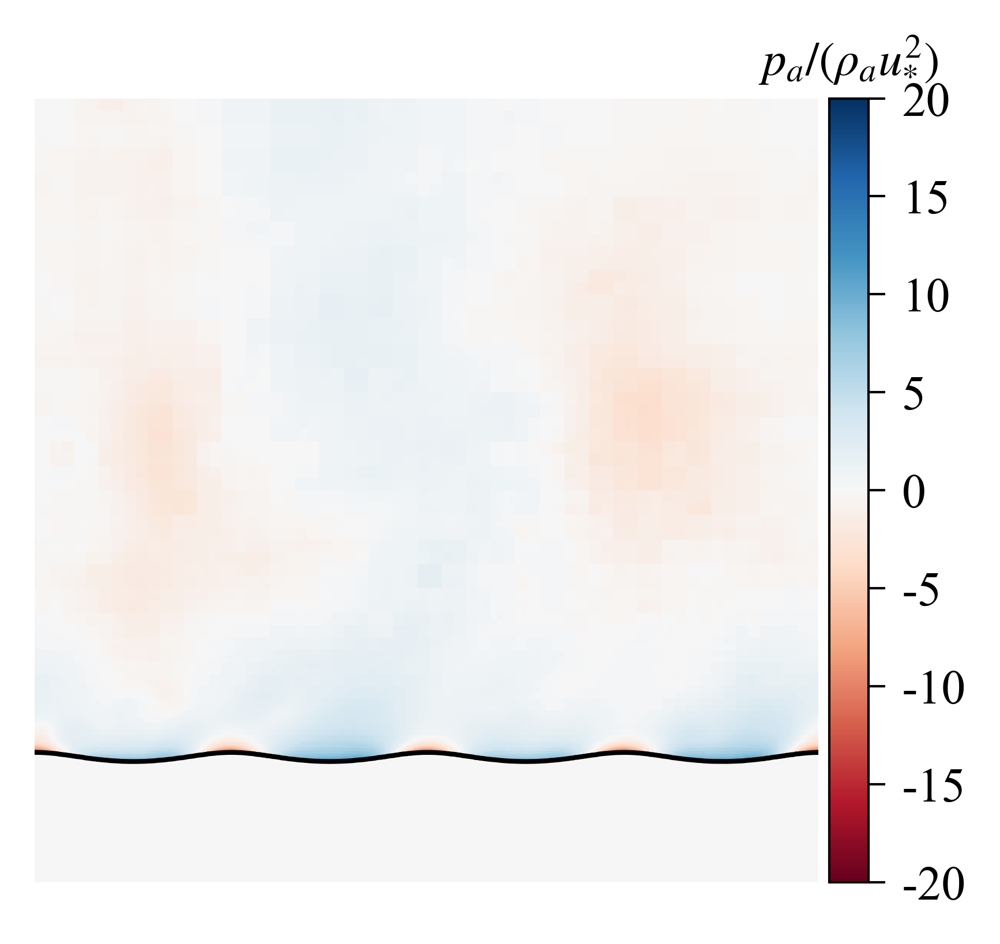

In [7]:
""" Some visualization """
fig = plt.figure(figsize=[4,3])
case = case2
# quant = case.uy_2D[-1]*(1-case.f_2D[-1])/case.ustar
f_2D = case.f_2D[-1]
for i in tqdm(range(0, len(case.p['p_2D']))):
    case.p['p_2D'][i] = case.p['p_2D'][i]*(1-f_2D)**10 # Air velocity
    paverage = np.average(case.p['p_2D'][i][:,90:512])
    case.p['p_2D'][i] = (case.p['p_2D'][i] - paverage)*(1-f_2D)**10
quant = case.p['p_2D'][-1]*(1-case.f_2D[-1])/case.ustar**2/case.rho2

img = plt.imshow(np.rot90(quant), cmap='RdBu', extent=[-np.pi,np.pi,0,2*np.pi],
                 vmax = 20, vmin = -20)
xarray = np.linspace(-np.pi, np.pi, 512)
eta = np.roll(np.average(case.phase['eta'][-1], axis=0), -case.phase['idx'][-1], axis=0)
plt.plot(xarray, eta, c='k', lw=1)
# plt.plot(xarray, 1.14*np.ones(np.size(xarray)), '--', lw=0.5, color='gray')
cbar = fig.colorbar(img, orientation="vertical", pad=0.01)
plt.axis('off')
# cbar.ax.text(0.5, 1.05, r'$\overline{u^{\prime} w^{\prime}}$', ha='center', va='center', transform=cbar.ax.transAxes)
# cbar.ax.text(0.5, 1.05, r'$(\overline{u^{\prime} w^{\prime}} - \langle u^{\prime} w^{\prime} \rangle)/u_{*}^2$', ha='center', va='center', transform=cbar.ax.transAxes)
cbar.ax.text(0.5, 1.05, r'$p_a/(\rho_a u_{*}^2)$', ha='center', va='center', transform=cbar.ax.transAxes)

In [12]:
import csv 
with open("shared_data/pressure_CU16/pressure.csv","w+") as my_csv:
    csvWriter = csv.writer(my_csv,delimiter=',')
    csvWriter.writerows(np.round(quant,6))

In [13]:
with open("shared_data/pressure_CU16/eta.csv","w+") as my_csv:
    csvWriter = csv.writer(my_csv,delimiter=',')
    csvWriter.writerow(['x','eta'])
    for i in range(len(xarray)):
        csvWriter.writerow([np.round(xarray[i],6),np.round(eta[i],6)])

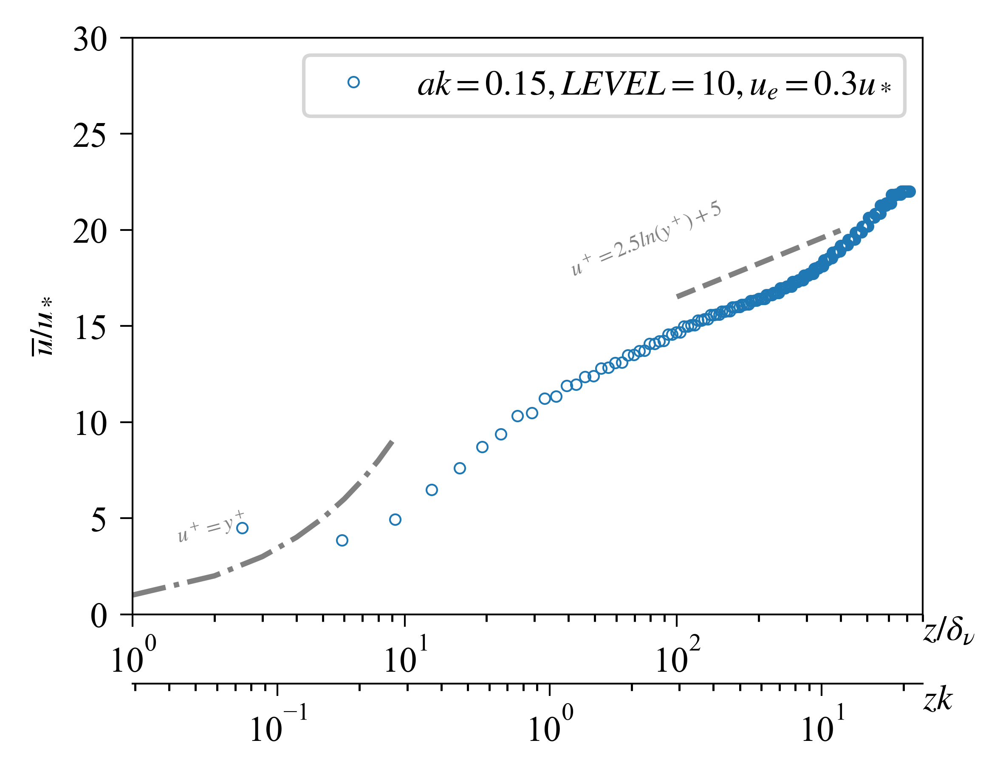

In [6]:
""" The pre cases mean profile """
fig = plt.figure(figsize=[4,3]); ax = plt.gca()

def draw(case):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.uxmean = np.average(case.ux_2D, axis=(0,1))
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, case.uxmean[31:-1:2]/case.ustar, 
             marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0,
             label = r'$ak=%.2f, LEVEL=%g, u_e=%gu_*$' %(case.ak,case.LEVEL,case.emax)) 

draw(case1)


y = np.arange(1,10)
plt.plot(y, y, '-.', color='gray')
y = np.arange(100,400)
plt.plot(y, 1/0.4*np.log(y)+5, '--', color='gray')
# plt.plot(y, 1/0.41*np.log(y)+6, color=plt.get_cmap('tab20c')(0))
ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
        color='gray', transform=ax.transAxes)
ax.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+5$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 30])
plt.xlim([1, 800])
plt.ylabel(r'$\overline{u}/u_*$') 

case = case1

def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend()

### <a class="anchor" id="2">Mean profiles</a>
[back](#0)

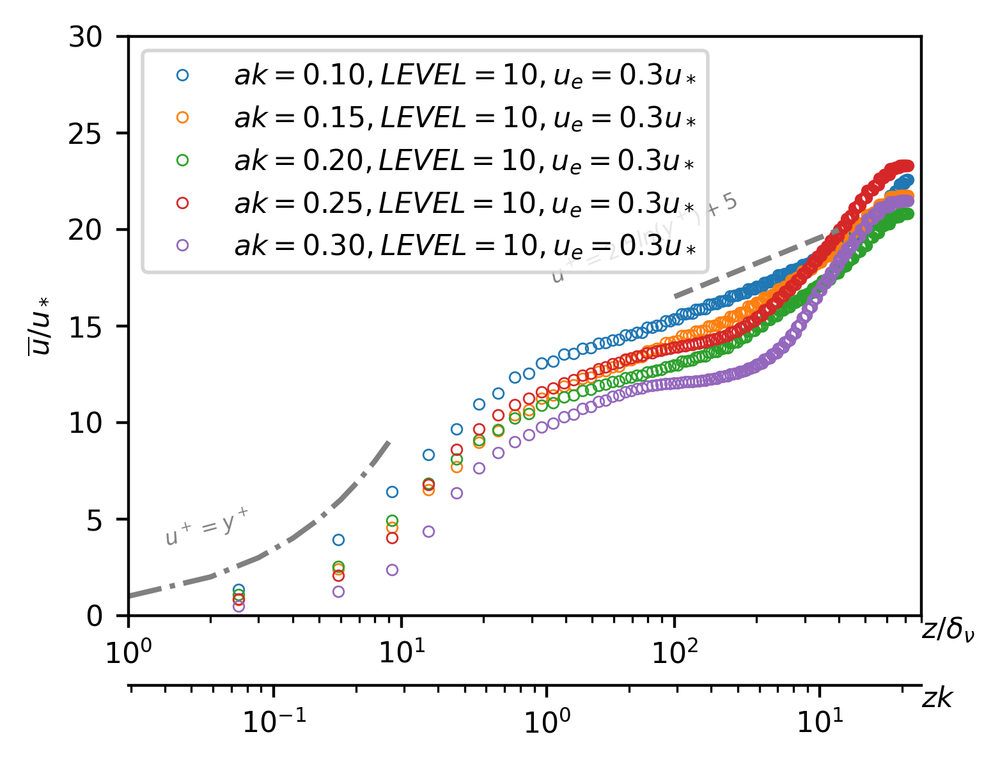

In [5]:
""" The pre cases mean profile """
fig = plt.figure(figsize=[4,3]); ax = plt.gca()

def draw(case):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.uxmean = np.average(case.ux_2D, axis=(0,1))
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, case.uxmean[31:-1:2]/case.ustar, 
             marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0,
             label = r'$ak=%.2f, LEVEL=%g, u_e=%gu_*$' %(case.ak,case.LEVEL,case.emax)) 

draw(case_pre2)
# draw(case_pre3)
# draw(case_pre4)
draw(case_pre6)
draw(case_pre1)
draw(case_pre7)
draw(case_pre8)


y = np.arange(1,10)
plt.plot(y, y, '-.', color='gray')
y = np.arange(100,400)
plt.plot(y, 1/0.4*np.log(y)+5, '--', color='gray')
# plt.plot(y, 1/0.41*np.log(y)+6, color=plt.get_cmap('tab20c')(0))
ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
        color='gray', transform=ax.transAxes)
ax.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+5$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 30])
plt.xlim([1, 800])
plt.ylabel(r'$\overline{u}/u_*$') 

case = case_pre1

def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend()

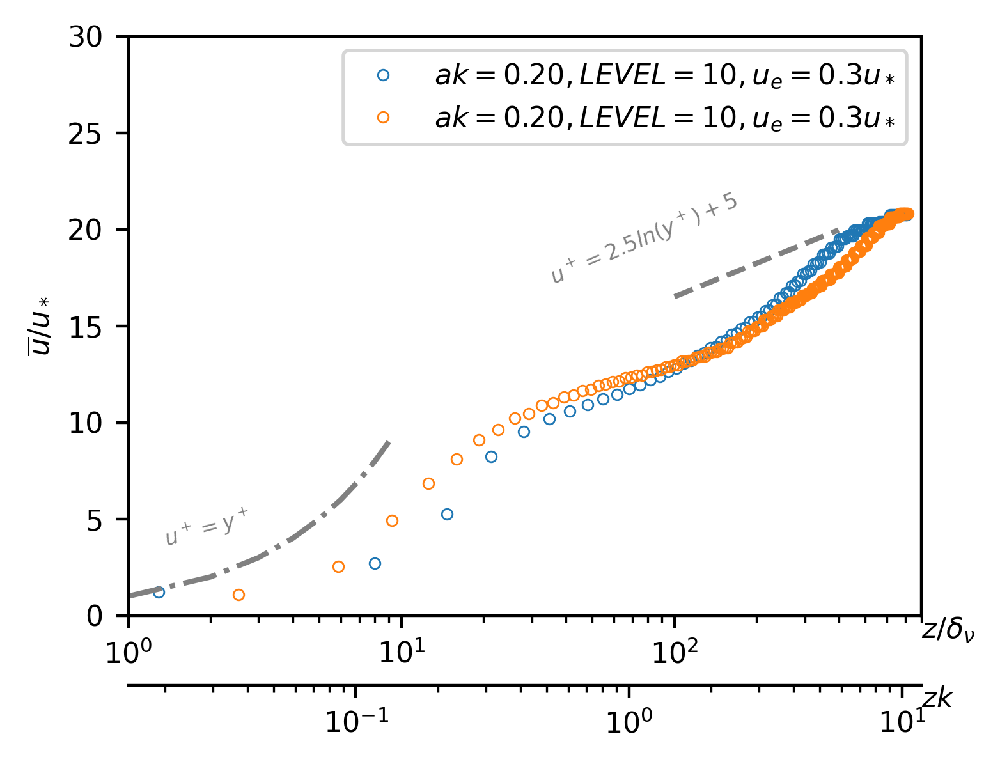

In [15]:
""" Mean profile: comparing different aspect ratios """
fig = plt.figure(figsize=[4,3]); ax = plt.gca()

def draw(case):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.uxmean = np.average(case.ux_2D, axis=(0,1))
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, case.uxmean[31:-1:2]/case.ustar, 
             marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0,
             label = r'$ak=%.2f, LEVEL=%g, u_e=%gu_*$' %(case.ak,case.LEVEL,case.emax)) 

draw(case_pre10_aspect)
draw(case_pre1)

y = np.arange(1,10)
plt.plot(y, y, '-.', color='gray')
y = np.arange(100,400)
plt.plot(y, 1/0.4*np.log(y)+5, '--', color='gray')
# plt.plot(y, 1/0.41*np.log(y)+6, color=plt.get_cmap('tab20c')(0))
ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
        color='gray', transform=ax.transAxes)
ax.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+5$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 30])
plt.xlim([1, 800])
plt.ylabel(r'$\overline{u}/u_*$') 

case = case_pre10_aspect

def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend()

In [7]:
""" REWRITTEN water profile interpolation function! """
from scipy.interpolate import interp1d
def air_profile_new(u_air, eta):
    """ uwater: a 2D array of water velocity 
        eta: a 1D array of surface """
    u_air_interp = np.zeros(u_air.shape)
    zplot = np.zeros(u_air.shape) # To show in the original cartesian grid z where the interpolating grid z' is
    for i in range(u_air.shape[0]): # For each x
        z = np.linspace(-1,2*np.pi-1,512,endpoint=False) + 2*np.pi/2/512
        f = interp1d(z, u_air[i,:], kind='quadratic')
        # The ratio to make sure that the cartesian representation of z' falls within the domain
        zeta = np.linspace(-1,2*np.pi-1,512,endpoint=False) + 2*np.pi/2/512
        zgrid = zeta + eta[i]*np.exp(-4*np.abs(zeta))
        zplot[i] = zgrid
        ugrid = f(zgrid[10:-10]) # Don't have to fill it all
        u_air_interp[i,10:-10] = ugrid
    u_air_1D = np.average(u_air_interp[:,:], axis=0)
    return u_air, u_air_interp, u_air_1D, zeta, zplot

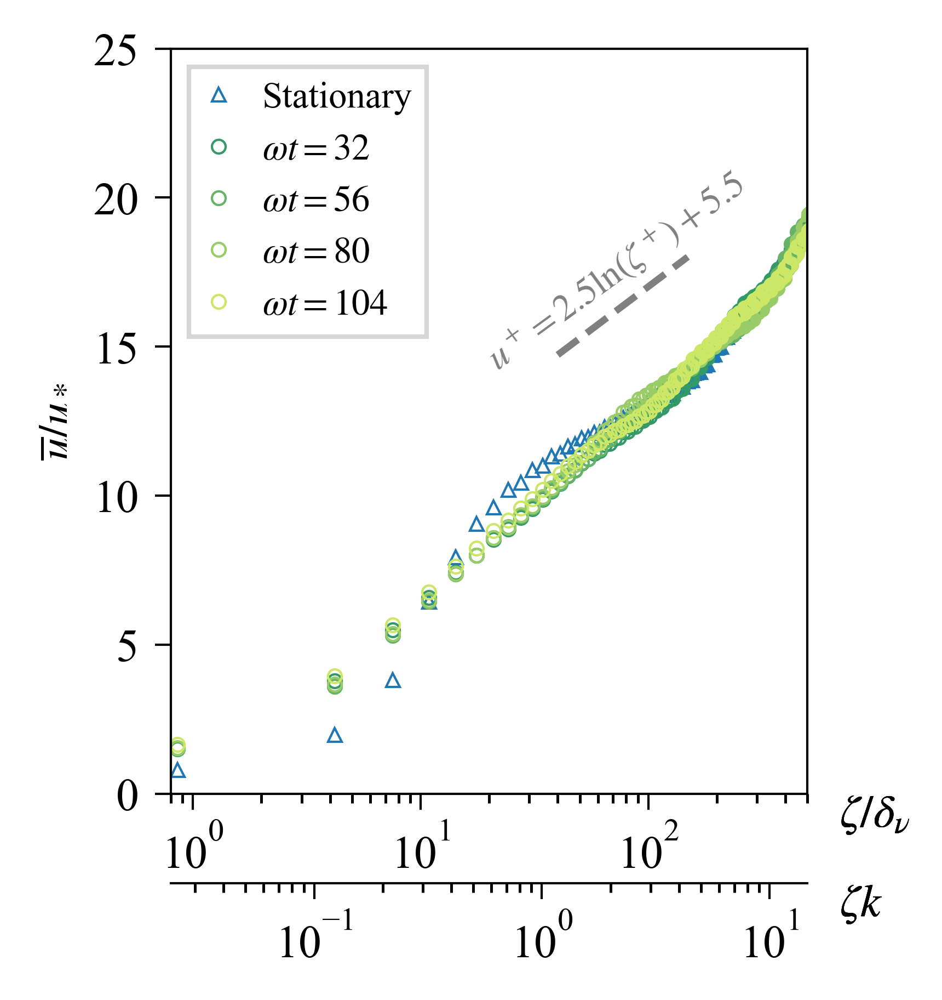

In [33]:
""" Mean profile: comparing stationary and travelling waves """
fig = plt.figure(figsize=[2.5,3]); ax = plt.gca()

""" A second x axis """
case = case_pre2
def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau
secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))

def draw(case, uxmean, color='C0', marker='o', label='Stationary'):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[70:-1:2]-case.h)/case.ytau, uxmean[70:-1:2]/case.ustar, c=color,
             marker=marker, mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, label=label) 


uxmean = np.average(case_pre2.ux_2D, axis=(0,1))
draw(case_pre2, uxmean, marker='^')
# for i in range(0, len(case_pre2.ux_2D)):
#     uxmean = np.average(case_pre2.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))

# The new precursor case is about the same as the old one
# uxmean = np.average(case_pre2_new.ux_2D[10:], axis=(0,1))
# draw(case_pre2_new, uxmean, marker='s', color='C1')
# for i in range(0, len(case_pre2_new.ux_2D)):
#     uxmean = np.average(case_pre2_new.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))

case = case6
for j,i in enumerate(np.array([60,63,66,69])-case.tstart):

# case = case5
# for j,i in enumerate(np.array([65,75,85,95])-case.tstart):

# case = case4
# # for j,i in enumerate(np.array([60,70,90,100,106])-case.tstart):
# for j,i in enumerate(np.array([60,70,90,100])-case.tstart):
    """ Without coordinate transformation """
#     uxmean = np.average(case.ux_2D[i], axis=0)
#     draw(case, uxmean, label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')(1-i/30))
#     ax.annotate(r'$zk$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
#     ax.annotate(r'$z/\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

    """ With coordinate transformation """
    t = case.field_t[j]
    phasei = np.where(np.isclose(np.array(case.phase['t']), t))[0][0]
    idx = case.phase['idx'][phasei]
    eta = np.roll(case.phase['eta'][phasei], -idx, axis=1) 
    eta_1D = np.average(eta, axis=0) - np.average(eta) 
    ux_2D = case.ux_2D[i]*(1-case.f_2D[i])**4
    u_air, u_air_interp, u_air_1D, zeta, zplot = air_profile_new (ux_2D, eta_1D)
    draw(case, u_air_1D, label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')((j+1)/5))
    ax.annotate(r'$\zeta k$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
    ax.annotate(r'$\zeta /\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

# y = np.arange(1,10)
# plt.plot(y, y, '-.', color='gray')
y = np.arange(40,150)
plt.plot(y, 1/0.4*np.log(y)+5.5, '--', color='gray')
# ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
#         color='gray', transform=ax.transAxes)
ax.text(0.7, 0.7, r'$u^+=2.5\ln(\zeta^+)+5.5$', ha='center', va='center', rotation=36, fontsize=8,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 25])
plt.xlim([0.8, 500])
plt.ylabel(r'$\overline{u}/u_*$') 

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend(fancybox=False, handlelength=0.8, fontsize=8)
fig.savefig('./review/mean_uair_CU8.pdf', bbox_inches='tight', pad_inches=0.1)

43
28


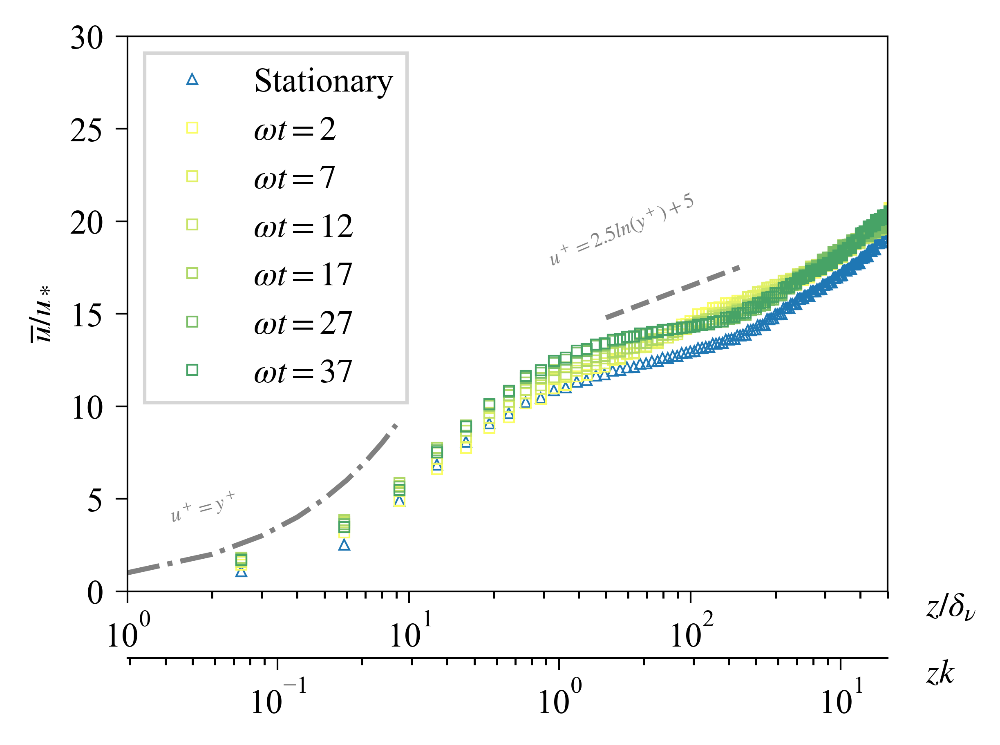

In [84]:
""" Mean profile: comparing stationary and travelling waves """
fig = plt.figure(figsize=[4,3]); ax = plt.gca()

def draw(case, uxmean, color='C0', marker='o', label='Stationary'):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, uxmean[31:-1:2]/case.ustar, c=color,
             marker=marker, mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0,label=label) 


uxmean = np.average(case_pre2.ux_2D, axis=(0,1))
draw(case_pre1, uxmean, marker='^')
# for i in range(0, len(case_pre2.ux_2D)):
#     uxmean = np.average(case_pre2.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))

# The new precursor case is about the same as the old one
# uxmean = np.average(case_pre2_new.ux_2D[10:], axis=(0,1))
# draw(case_pre2, uxmean, marker='s', color='C1')
# for i in range(0, len(case_pre2_new.ux_2D)):
#     uxmean = np.average(case_pre2_new.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))
print(len(case1.ux_2D))
case = case1
for i in (np.array([45,50,55,60,70,80])-case.tstart):
    uxmean = np.average(case.ux_2D[i], axis=0)
    draw(case, uxmean, marker='s', label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')(1-i/50))
print(len(case3.ux_2D))
# case = case3
# for i in (np.array([50,60,70])-case.tstart):
#     uxmean = np.average(case.ux_2D[i], axis=0)
#     draw(case, uxmean, label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')(1-i/50))


y = np.arange(1,10)
plt.plot(y, y, '-.', color='gray')
y = np.arange(50,150)
plt.plot(y, 1/0.4*np.log(y)+5, '--', color='gray')
# plt.plot(y, 1/0.41*np.log(y)+6, color=plt.get_cmap('tab20c')(0))
ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
        color='gray', transform=ax.transAxes)
ax.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+5$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 30])
plt.xlim([1, 500])
plt.ylabel(r'$\overline{u}/u_*$') 

case = case_pre1

def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend(fancybox=False)

In [ ]:
""" Mean profile: comparing stationary and travelling waves """
fig = plt.figure(figsize=[4,3]); ax = plt.gca()

def draw(case, uxmean, color='C0', marker='o', label='Stationary'):
    case.ytau = (2*np.pi-case.h)/case.Retau
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2 # Centered grid for interpolation
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, uxmean[31:-1:2]/case.ustar, c=color,
             marker=marker, mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0,label=label) 


uxmean = np.average(case_pre2.ux_2D, axis=(0,1))
draw(case_pre2, uxmean, marker='^')
# for i in range(0, len(case_pre2.ux_2D)):
#     uxmean = np.average(case_pre2.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))

# The new precursor case is about the same as the old one
# uxmean = np.average(case_pre2_new.ux_2D[10:], axis=(0,1))
# draw(case_pre2, uxmean, marker='s', color='C1')
# for i in range(0, len(case_pre2_new.ux_2D)):
#     uxmean = np.average(case_pre2_new.ux_2D[i], axis=0)
#     draw(case_pre2, uxmean, marker='s', color=plt.cm.get_cmap('summer')(1-i/len(case_pre2_new.ux_2D)))
print(len(case6.ux_2D))

case = case6
for i in (np.arange(60,80,10)-case.tstart):
    uxmean = np.average(case.ux_2D[i], axis=0)
    draw(case, uxmean, marker='s', label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')(1-i/50))

case = case4
for i in (np.array([60,70,90,100,106])-case.tstart):
    uxmean = np.average(case.ux_2D[i], axis=0)
    draw(case, uxmean, label=r'$\omega t = %.0f$' % (case.field_t[i]*case.wave.omega),color=plt.cm.get_cmap('summer')(1-i/50))



y = np.arange(1,10)
plt.plot(y, y, '-.', color='gray')
y = np.arange(50,150)
plt.plot(y, 1/0.4*np.log(y)+5, '--', color='gray')
# plt.plot(y, 1/0.41*np.log(y)+6, color=plt.get_cmap('tab20c')(0))
ax.text(0.1, 0.15, r'$u^+=y^+$', ha='center', va='center', rotation=15., fontsize=6, 
        color='gray', transform=ax.transAxes)
ax.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+5$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax.transAxes)
plt.xscale('log')
plt.ylim([0, 30])
plt.xlim([1, 500])
plt.ylabel(r'$\overline{u}/u_*$') 

case = case_pre2

def forward(x):
    global case
    return x*case.ytau*case.k
def back(x):
    global case
    return x/case.k/case.ytau

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

# for case in (case_pre2,case_pre6,case_pre1):
#     filename = 'Stats/mean_ak%g.csv' %case.ak
#     with open(filename,'w') as f:
#         f.write('z+,u+\n')
#         np.savetxt(f, np.array(list(zip((case.yarray[31:-1:2]-1)/case.ytau, case.uxmean[31:-1:2]/case.ustar))), delimiter=',', fmt='%f')
# #         np.savetxt(f, case.yarray[31:-1:2]-1, delimiter=',', fmt='%f')

plt.legend(fancybox=False)

### <a class="anchor" id="3">Wave and Reynolds stress</a>
[back](#0)

In [117]:
""" Compute the phase average and the horizontal average. 
    case.uy_2D_phaseaver-case.uy_2D_horizaver is the wave coherent part.
    case.field_2D is of dimension time*Nx*Nz
    case.field_2D_phaseaver and case.field_2D_horizaver is of dimension Nx*Ny
    
    Compute the turbulent stress. 
    Use the value of ux_2D_phaseaver and uy_2D_phaseaver computed above (broadcasted back to 3D).
    Fully 3D no pre average in the spanwise: SHOULD RECHECK IF MAKES A DIFFERENCE!
"""
def compute_stress(case):
    case.ux_2D = np.array(case.ux_2D)
    case.uy_2D = np.array(case.uy_2D)
    case.f_2D = np.array(case.f_2D)

    """ Phase average (ensemble mean) """
    case.ux_2D_phaseaver = np.average(case.ux_2D, axis=0) 
    case.uy_2D_phaseaver = np.average(case.uy_2D, axis=0)
    case.f_2D_phaseaver = np.average(case.f_2D, axis=0)

    """ Horizontal average: Average over x and then broadcase to a 2D array again.
        TODO: Can add wave cordinate following average here.
    """
    case.ux_2D_horizaver = np.tile(np.average(case.ux_2D, axis=(0,1)), (512,1))
    case.uy_2D_horizaver = np.tile(np.average(case.uy_2D, axis=(0,1)), (512,1))
    case.f_2D_horizaver = np.tile(np.average(case.f_2D, axis=(0,1)), (512,1))

    """ Compute the turbulent stress.
    """
    case.uxuy_2D = []
    ux_3D_phaseaver = np.tile(case.ux_2D_phaseaver, (255,1,1))
    uy_3D_phaseaver = np.tile(case.uy_2D_phaseaver, (255,1,1))

    for (i,t) in tqdm(enumerate(case.field_t)):

        ux_3D = {'name':'ux', 'value':[]} # axis0 in z, axis1 in x, axis2 in y  (in the code)
        uy_3D = {'name':'uy', 'value':[]}
        f_3D = {'name':'f', 'value':[]}
        tsimu = t + case.tstart
        phasei = np.where(np.isclose(np.array(case.phase['t']), t))[0][0]
        idx = case.phase['idx'][phasei]

        # Read in the fields either from pickle or from slice data
        for field in (ux_3D,uy_3D,f_3D):         
            """NOTICE: to accomodate different pickle versions"""
            picklename = case.path + 'field/' + 'pickle_tiger/' + field['name']+'_t%g' % tsimu +'.pkl'
    #             picklename = working_dir + 'field/' + 'pickle_desktop/' + field['name']+'_t%g' % t +'.pkl'
            exists = os.path.exists(picklename)
            # If the pickle is there read in the pickles
            if exists:
                field['value'] = load_object(picklename)
                print('pickle restored!')
            # If no pickle read in from the slice files and pickle dump
            if not exists:
                for sn in range (0, NSLICE-1):
                    filename = case.path + 'field/'+field['name']+'_t%g_slice%g' % (tsimu,sn)
                    snapshot = np.loadtxt(filename, dtype = np.str, delimiter='\t')
                    snapshot.reshape([NGRID,NGRID+1])
                    field['value'].append(snapshot[:,0:NGRID].astype(np.float))
                field['value'] = np.array(field['value'])
                save_object(field['value'], picklename)           
            field['value'] = np.roll(field['value'], -idx, axis=1)

        re_stress_3D = (ux_3D['value']-ux_3D_phaseaver)*(uy_3D['value']-uy_3D_phaseaver)*(1-f_3D['value'])
        re_stress_3D = np.roll(re_stress_3D, -idx, axis=1)   
        case.uxuy_2D.append(np.average(re_stress_3D, axis=0))    

In [118]:
for case in tqdm((case1,case2,case3,case_pre1,case4,case5,case6,case_pre2)):
    compute_stress(case)



  0%|          | 0/8 [00:00<?, ?it/s]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:03,  3.01s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:05,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.80s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.79s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:16,  2.77s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:19,  2.77s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:22,  2.77s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:25,  2.77s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:27,  2.76s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:30,  2.76s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:33,  2.78s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:36,  2.79s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:39,  2.79s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:41,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:44,  2.81s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:47,  2.80s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:50,  2.79s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:53,  2.80s/it]

pickle restored!
pickle restored!
pickle restored!





20it [00:55,  2.79s/it]

pickle restored!
pickle restored!
pickle restored!





21it [00:58,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





22it [01:01,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





23it [01:04,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





24it [01:07,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





25it [01:10,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





26it [01:12,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





27it [01:15,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





28it [01:18,  2.81s/it]

pickle restored!
pickle restored!
pickle restored!





29it [01:21,  2.81s/it]

pickle restored!
pickle restored!
pickle restored!





30it [01:24,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





31it [01:27,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





32it [01:29,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





33it [01:32,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





34it [01:35,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





35it [01:38,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





36it [01:41,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





37it [01:44,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





38it [01:46,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





39it [01:49,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





40it [01:52,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





41it [01:55,  2.81s/it]

pickle restored!
pickle restored!
pickle restored!





42it [01:58,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





43it [02:01,  2.82s/it]


 12%|█▎        | 1/8 [02:01<14:12, 121.79s/it]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:03,  3.00s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:05,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:19,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:22,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:25,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:28,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:31,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:34,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:37,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:39,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:42,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:45,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:48,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:51,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:54,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





20it [00:57,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





21it [01:00,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





22it [01:03,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





23it [01:05,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





24it [01:08,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





25it [01:11,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





26it [01:16,  3.43s/it]

pickle restored!
pickle restored!
pickle restored!





27it [01:19,  3.33s/it]

pickle restored!
pickle restored!
pickle restored!





28it [01:22,  3.19s/it]

pickle restored!
pickle restored!
pickle restored!





29it [01:25,  3.10s/it]

pickle restored!
pickle restored!
pickle restored!





30it [01:28,  3.01s/it]

pickle restored!
pickle restored!
pickle restored!





31it [01:30,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





32it [01:33,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





33it [01:36,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





34it [01:39,  2.97s/it]

pickle restored!
pickle restored!
pickle restored!





35it [01:42,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





36it [01:45,  2.93s/it]


 25%|██▌       | 2/8 [03:47<11:15, 112.59s/it]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:02,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:05,  2.84s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.90s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:20,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:25,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:28,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:31,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:34,  2.82s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:37,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:40,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:43,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:46,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:49,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:52,  3.00s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:55,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





20it [00:57,  2.90s/it]

pickle restored!
pickle restored!
pickle restored!





21it [01:00,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





22it [01:03,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





23it [01:06,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





24it [01:09,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





25it [01:12,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





26it [01:15,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





27it [01:18,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





28it [01:21,  2.91s/it]


 38%|███▊      | 3/8 [05:10<08:13, 98.66s/it] 


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:03,  3.18s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:06,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:20,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:26,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:29,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:31,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:34,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:37,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:40,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:43,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:46,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:49,  2.90s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:52,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:55,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





20it [00:58,  2.91s/it]


 50%|█████     | 4/8 [06:08<05:31, 82.89s/it]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:02,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:05,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.90s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.97s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:20,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  3.05s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:26,  2.97s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:29,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:32,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:35,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:38,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:40,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:43,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:49,  3.77s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:52,  3.53s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:55,  3.33s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:58,  3.27s/it]

pickle restored!
pickle restored!
pickle restored!





20it [01:01,  3.20s/it]

pickle restored!
pickle restored!
pickle restored!





21it [01:04,  3.11s/it]

pickle restored!
pickle restored!
pickle restored!





22it [01:07,  3.13s/it]

pickle restored!
pickle restored!
pickle restored!





23it [01:10,  3.14s/it]

pickle restored!
pickle restored!
pickle restored!





24it [01:13,  3.11s/it]

pickle restored!
pickle restored!
pickle restored!





25it [01:16,  3.05s/it]

pickle restored!
pickle restored!
pickle restored!





26it [01:19,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





27it [01:22,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





28it [01:25,  3.00s/it]

pickle restored!
pickle restored!
pickle restored!





29it [01:28,  3.03s/it]

pickle restored!
pickle restored!
pickle restored!





30it [01:31,  3.02s/it]

pickle restored!
pickle restored!
pickle restored!





31it [01:34,  3.03s/it]

pickle restored!
pickle restored!
pickle restored!





32it [01:37,  3.05s/it]

pickle restored!
pickle restored!
pickle restored!





33it [01:40,  3.00s/it]

pickle restored!
pickle restored!
pickle restored!





34it [01:43,  2.99s/it]

pickle restored!
pickle restored!
pickle restored!





35it [01:46,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





36it [01:49,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





37it [01:52,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





38it [01:55,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





39it [01:58,  2.97s/it]

pickle restored!
pickle restored!
pickle restored!





40it [02:01,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





41it [02:04,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





42it [02:07,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





43it [02:10,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





44it [02:13,  2.99s/it]

pickle restored!
pickle restored!
pickle restored!





45it [02:16,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





46it [02:18,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





47it [02:21,  2.83s/it]

pickle restored!
pickle restored!
pickle restored!





48it [02:24,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





49it [02:27,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





50it [02:30,  3.01s/it]


 62%|██████▎   | 5/8 [08:40<05:22, 107.56s/it]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:03,  3.09s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:06,  3.02s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:12,  3.00s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:15,  3.08s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:18,  3.03s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:21,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  2.90s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:26,  2.86s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:29,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:32,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:35,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:38,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:41,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:43,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





16it [00:46,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





17it [00:49,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





18it [00:52,  2.89s/it]

pickle restored!
pickle restored!
pickle restored!





19it [00:55,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





20it [00:58,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





21it [01:01,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





22it [01:04,  2.87s/it]

pickle restored!
pickle restored!
pickle restored!





23it [01:07,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





24it [01:10,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





25it [01:13,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





26it [01:16,  3.02s/it]

pickle restored!
pickle restored!
pickle restored!





27it [01:19,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





28it [01:22,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





29it [01:25,  3.16s/it]

pickle restored!
pickle restored!
pickle restored!





30it [01:28,  3.15s/it]

pickle restored!
pickle restored!
pickle restored!





31it [01:31,  3.08s/it]

pickle restored!
pickle restored!
pickle restored!





32it [01:34,  3.02s/it]

pickle restored!
pickle restored!
pickle restored!





33it [01:37,  2.99s/it]

pickle restored!
pickle restored!
pickle restored!





34it [01:40,  3.01s/it]

pickle restored!
pickle restored!
pickle restored!





35it [01:43,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





36it [01:46,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





37it [01:49,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





38it [01:52,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





39it [01:55,  2.88s/it]

pickle restored!
pickle restored!
pickle restored!





40it [01:58,  3.16s/it]

pickle restored!
pickle restored!
pickle restored!





41it [02:01,  3.16s/it]

pickle restored!
pickle restored!
pickle restored!





42it [02:04,  3.08s/it]

pickle restored!
pickle restored!
pickle restored!





43it [02:07,  2.98s/it]


 75%|███████▌  | 6/8 [10:48<03:49, 114.69s/it]


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:02,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:05,  2.85s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  3.05s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.98s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.99s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:20,  2.99s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:26,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:29,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:32,  2.91s/it]

pickle restored!
pickle restored!
pickle restored!





12it [00:35,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





13it [00:38,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





14it [00:41,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





15it [00:44,  2.94s/it]


 88%|████████▊ | 7/8 [11:33<01:31, 91.77s/it] 


0it [00:00, ?it/s]

pickle restored!
pickle restored!
pickle restored!





1it [00:03,  3.03s/it]

pickle restored!
pickle restored!
pickle restored!





2it [00:06,  3.09s/it]

pickle restored!
pickle restored!
pickle restored!





3it [00:08,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





4it [00:11,  2.92s/it]

pickle restored!
pickle restored!
pickle restored!





5it [00:14,  2.96s/it]

pickle restored!
pickle restored!
pickle restored!





6it [00:17,  2.93s/it]

pickle restored!
pickle restored!
pickle restored!





7it [00:20,  2.94s/it]

pickle restored!
pickle restored!
pickle restored!





8it [00:23,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





9it [00:26,  2.95s/it]

pickle restored!
pickle restored!
pickle restored!





10it [00:30,  3.16s/it]

pickle restored!
pickle restored!
pickle restored!





11it [00:33,  3.02s/it]


100%|██████████| 8/8 [12:06<00:00, 90.85s/it]


In [112]:
""" Compute the turbulent stress (average over time sequence)
    Use 2D pre average in the spanwise: SHOULD RECHECK IF MAKES A DIFFERENCE!
'"""
frame = case.ux_2D.shape[0]
case.wavestress_2D = (case.uy_2D_phaseaver-case.uy_2D_horizaver)*(case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25**2*(1-case.f_2D[0])
case.turbstress_2D = np.average((case.uy_2D-np.tile(case.uy_2D_phaseaver, (frame,1,1)))*(case.ux_2D-np.tile(case.ux_2D_phaseaver, (frame,1,1))), 
                                axis=0)/0.25**2*(1-case.f_2D[0])
case.turbstress_2D_from3D = np.average(case.uxuy_2D, axis=0)/0.25**2*(1-case.f_2D[0])

In [ ]:
""" What if we don't average over time sequence (or average over smaller windows)
'"""
frame = case.ux_2D.shape[0]
case.wavestress_2D = (case.uy_2D_phaseaver-case.uy_2D_horizaver)*(case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25**2*(1-case.f_2D[0])
case.turbstress_2D = np.average((case.uy_2D-np.tile(case.uy_2D_phaseaver, (frame,1,1)))*(case.ux_2D-np.tile(case.ux_2D_phaseaver, (frame,1,1))), 
                                axis=0)/0.25**2*(1-case.f_2D[0])
case.turbstress_2D_from3D = np.average(case.uxuy_2D, axis=0)/0.25**2*(1-case.f_2D[0])

In [130]:
from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, CUT=4, N=512):
    T = 4     # Sample Period
    fs = 512/T      # Sample rate, Hz
    cutoff = CUT    # desired cutoff frequency of the filter, Hz, slightly higher than actual 1.2 Hz
    nyq = 0.5 * fs  # Nyquist Frequency
    order = 2       # sin wave can be approx represented as quadratic
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

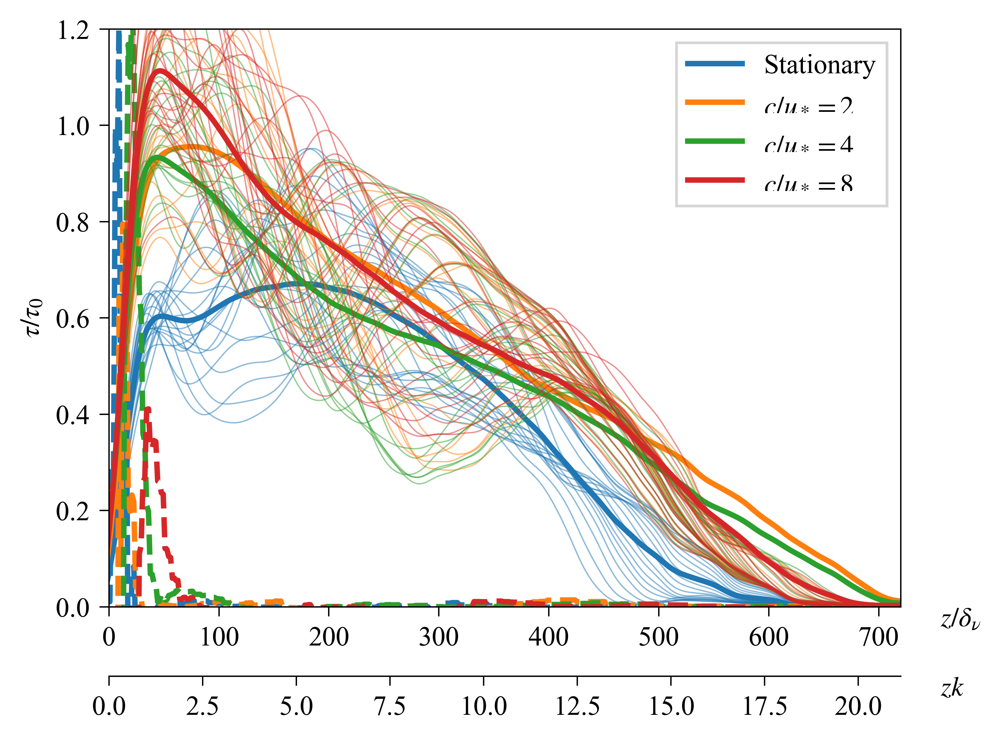

In [143]:
""" ak = 0.15 """
fig = plt.plot(figsize=[3,2]); ax = plt.gca()

def plot_Restress(case, color, label):
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
    case.ytau = (case.L0-case.h)/case.Retau
    for tindex in range(0,20):
        re = butter_lowpass_filter(-np.average(case.uxuy_2D[tindex], axis=0)/case.ustar**2)
        plt.plot((case.yarray-1)/case.ytau, re, c=color, lw=0.5, alpha=0.5)
    re = butter_lowpass_filter(-np.average(case.uxuy_2D, axis=(0,1))/case.ustar**2)
    plt.plot((case.yarray-1)/case.ytau, re, c=color, lw=2, label=label)
    case.wavestress_2D = (case.uy_2D_phaseaver-case.uy_2D_horizaver)*(case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25**2*(1-case.f_2D[0])
    plt.plot((case.yarray-1)/case.ytau, np.average(case.wavestress_2D, axis=0)/case.ustar**2, '--', c=color, lw=2)

secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

colorlist=['C0','C1','C2','C3']
plot_Restress(case_pre1, color=colorlist[0], label='Stationary')
for i,case in enumerate((case1,case2,case3)):
    plot_Restress(case, color=colorlist[i+1], label=r'$c/u_*=%.0f$' %(case.wave.c/case.ustar))
plt.xlim([0,720])
# plt.xlim([0,350])
plt.ylim([0,1.2])
plt.ylabel(r'$\tau/\tau_0$')
plt.legend(fancybox=False)

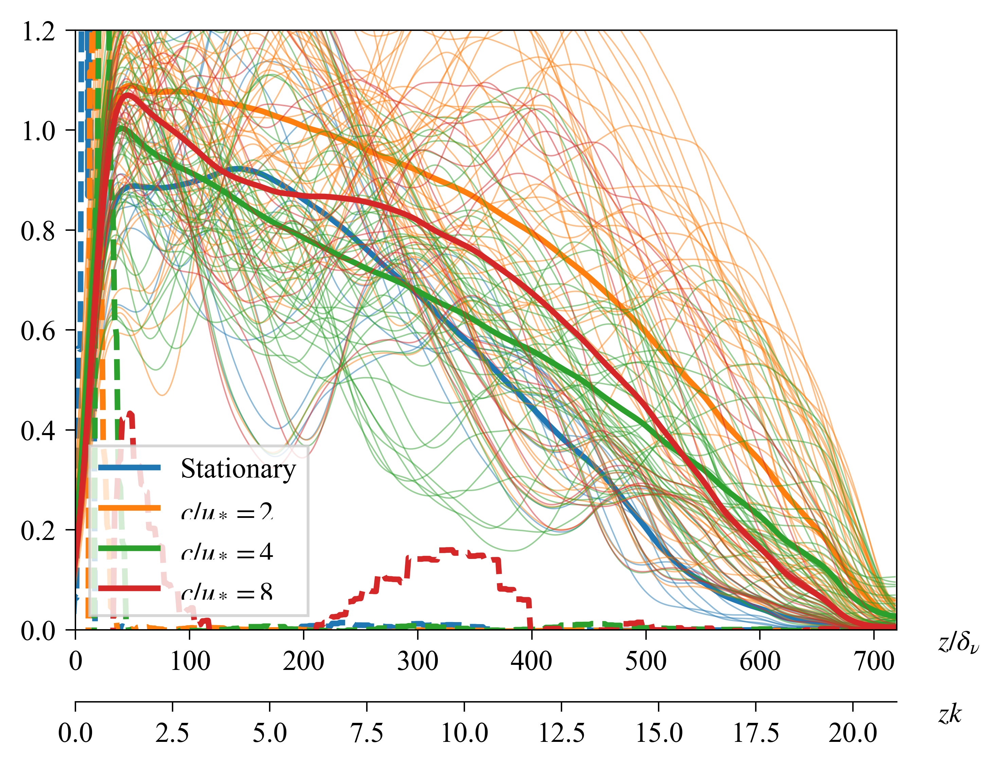

In [142]:
""" ak = 0.2 """
fig = plt.plot(figsize=[3,2]); ax = plt.gca()

def plot_Restress(case, color, label):
    case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
    case.ytau = (case.L0-case.h)/case.Retau
    for tindex in range(0,len(case.uxuy_2D)):
        re = butter_lowpass_filter(-np.average(case.uxuy_2D[tindex], axis=0)/case.ustar**2)
        plt.plot((case.yarray-1)/case.ytau, re, c=color, lw=0.5, alpha=0.5)
    re = butter_lowpass_filter(-np.average(case.uxuy_2D, axis=(0,1))/case.ustar**2)
    plt.plot((case.yarray-1)/case.ytau, re, c=color, lw=2, label=label)
    case.wavestress_2D = (case.uy_2D_phaseaver-case.uy_2D_horizaver)*(case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25**2*(1-case.f_2D[0])
    plt.plot((case.yarray-1)/case.ytau, np.average(case.wavestress_2D, axis=0)/case.ustar**2, '--', c=color, lw=2)

    
secax_x2 = ax.secondary_xaxis(-0.12, functions=(forward, back))
ax.annotate(r'$zk$', xy=(1.05, -0.12), ha='left', va='top', xycoords='axes fraction')
ax.annotate(r'$z/\delta_{\nu}$', xy=(1.05, 0), ha='left', va='top', xycoords='axes fraction')

colorlist=['C0','C1','C2','C3']
plot_Restress(case_pre2, color=colorlist[0], label='Stationary')
for i,case in enumerate((case4,case5,case6)):
    plot_Restress(case, color=colorlist[i+1], label=r'$c/u_*=%.0f$' %(case.wave.c/case.ustar))
plt.xlim([0,720])
# plt.xlim([0,350])
plt.ylim([0,1.2])
plt.legend(fancybox=False)

In [ ]:
""" Compute the phase average and the horizontal average. """
# case.uxuy_2D = np.array(case.uxuy_2D)
# case.uxuy_2D_phaseaver = np.average(case.uxuy_2D, axis=0)
# case.uxuy_2D_horizaver = np.tile(np.average(case.uxuy_2D, axis=(0,1)), (512,1))

Text(0.5, 1.05, '$\\tilde{u}\\tilde{w}/u_{*}^2$')

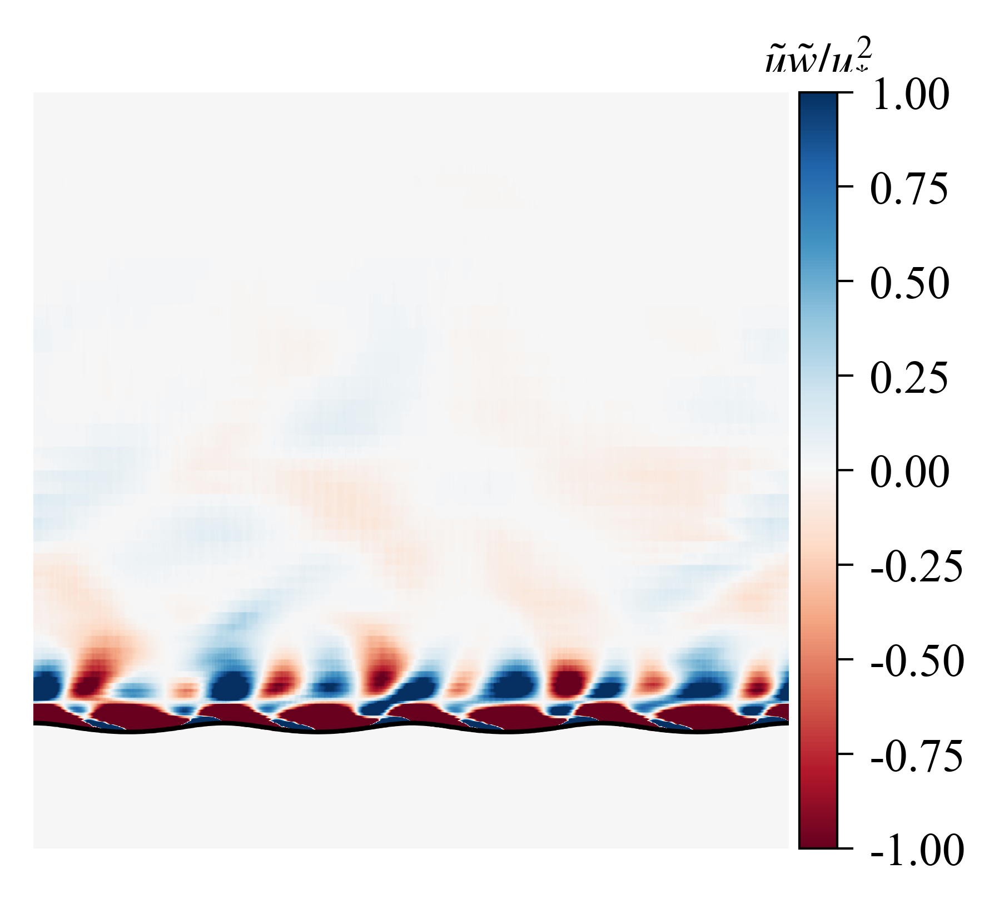

In [149]:
""" Some visualization """
fig = plt.figure(figsize=[4,3])
# quant = case.turbstress_2D_from3D
case = case3
quant = case.wavestress_2D/case.ustar**2

img = plt.imshow(np.rot90(quant), cmap='RdBu', extent=[-np.pi,np.pi,0,2*np.pi],
                 vmax = 1, vmin = -1)
xarray = np.linspace(-np.pi, np.pi, 512)
eta = np.roll(np.average(case.phase['eta'][0], axis=0), -case.phase['idx'][0], axis=0)
plt.plot(xarray, eta, c='k', lw=1)
# plt.plot(xarray, 1.14*np.ones(np.size(xarray)), '--', lw=0.5, color='gray')
cbar = fig.colorbar(img, orientation="vertical", pad=0.01)
plt.axis('off')
# cbar.ax.text(0.5, 1.05, r'$\overline{u^{\prime} w^{\prime}}$', ha='center', va='center', transform=cbar.ax.transAxes)
# cbar.ax.text(0.5, 1.05, r'$(\overline{u^{\prime} w^{\prime}} - \langle u^{\prime} w^{\prime} \rangle)/u_{*}^2$', ha='center', va='center', transform=cbar.ax.transAxes)
cbar.ax.text(0.5, 1.05, r'$\tilde{u}\tilde{w}/u_{*}^2$', ha='center', va='center', transform=cbar.ax.transAxes)

In [ ]:
""" Some visualization (velocity) """
fig = plt.figure(figsize=[4,3])
# quant = (case.ux_2D_horizaver-case.wave.c)/0.25*(1-case.f_2D[0]) # The quantity to be plotted
quant = (case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25*(1-case.f_2D[0]) # The quantity to be plotted

img = plt.imshow(np.rot90(quant), cmap='RdBu', extent=[-np.pi,np.pi,0,2*np.pi],
                 vmax = +0.5, vmin = -0.5)
xarray = np.linspace(-np.pi, np.pi, 512)
eta = np.roll(np.average(case.phase['eta'][0], axis=0), -case.phase['idx'][0], axis=0)
plt.plot(xarray, eta, c='k', lw=1)

cbar = fig.colorbar(img, orientation="vertical", pad=0.01)
plt.axis('off')
cbar.ax.text(0.5, 1.05, r'$\tilde{w}/u_{*}$', ha='center', va='center', transform=cbar.ax.transAxes)

In [25]:
from scipy.signal import butter,filtfilt
def butter_lowpass_filter(data, CUT=4, N=512):
    T = 4     # Sample Period
    fs = 512/T      # Sample rate, Hz
    cutoff = CUT    # desired cutoff frequency of the filter, Hz, slightly higher than actual 1.2 Hz
    nyq = 0.5 * fs  # Nyquist Frequency
    order = 2       # sin wave can be approx represented as quadratic
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

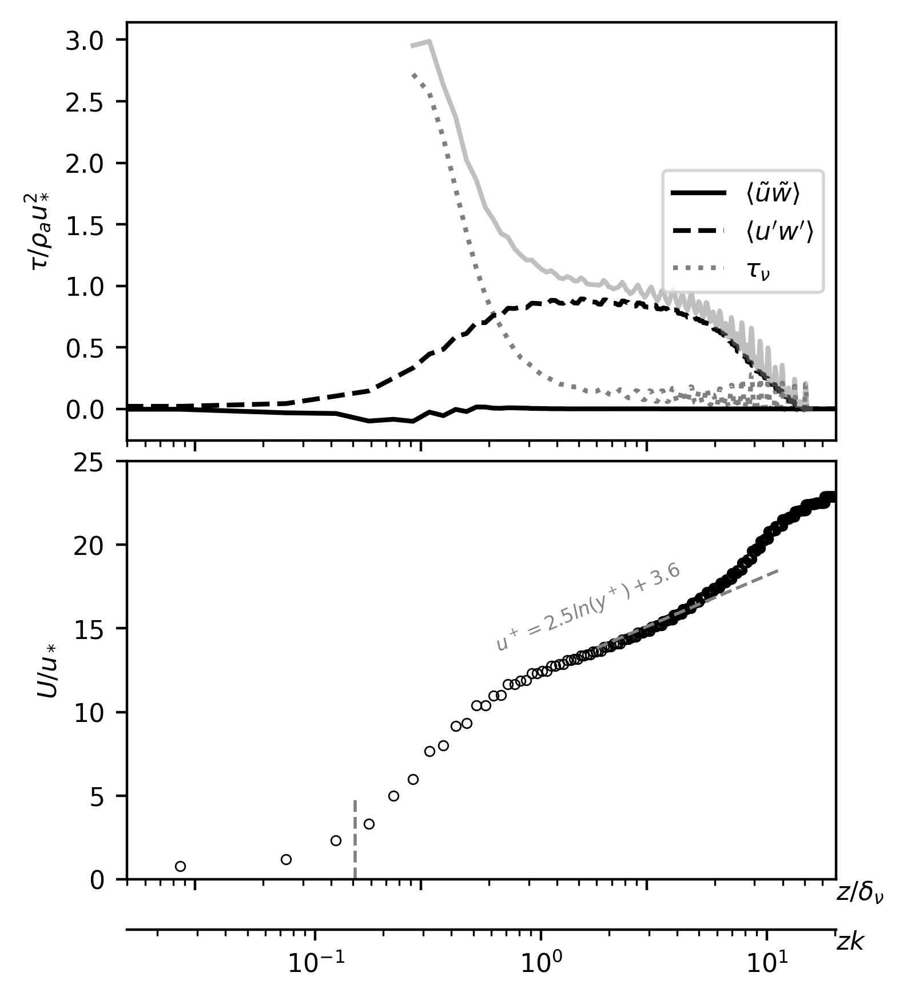

In [43]:
""" Plot the 1D profile along z
    Link with the two scales yk nad y/ytau 
"""

plt.figure(figsize=[4,7.5])

color = 'k'

""" Stress quantities. """
ax1 = plt.subplot(311)
ax1.set_ylabel(r"$\tau/\rho_a u_*^2$")
plt.setp(ax1.get_xticklabels(), visible=False)

range1 = 87; range2 = 400

def plot_stress (case, color):
    plt.plot((case.yarray-1)/case.ytau, -np.average(case.wavestress_2D, axis=0), color=color, label = r'$\langle\tilde{u}\tilde{w}\rangle$')
    plt.plot((case.yarray-1)/case.ytau, -np.average(case.turbstress_2D_from3D, axis=0), '--', color=color, label = r'$\langle u^{\prime}w^{\prime}\rangle$')
    # Compute the viscous shear stress
    ux_simu = (np.average(case.ux_2D_horizaver, axis=0))/case.ustar
    ux_smooth = butter_lowpass_filter(ux_simu[range1:range2], CUT=16, N=512)
    grad = np.gradient(ux_smooth)/(case.L0/case.N)
    tau_nu = grad*case.mu2/case.tau0
    plt.plot((case.yarray[range1:range2]-1)/case.ytau, tau_nu, ':', color=color, alpha = 0.5, label=r'$\tau_{\nu}$') # r'$|U(y)^{\prime}/kU||$'
    plt.plot((case.yarray-1)[range1:range2]/case.ytau, -np.average(case.wavestress_2D+case.turbstress_2D_from3D, axis=0)[range1:range2]+tau_nu, color='gray', alpha=0.5)
    return ((case.yarray-1)/case.ytau, -np.average(case.wavestress_2D, axis=0), -np.average(case.turbstress_2D_from3D, axis=0), np.average(case.ux_2D_horizaver, axis=0)/0.25, (case.yarray[range1:range2]-1)/case.ytau, tau_nu)

case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
case.ytau = (2*np.pi-1)/case.Retau; case.tau0 = case.rho2*case.ustar**2
a1,a2,a3,a4,a5,a6 = plot_stress(case, color)


def plot_velocity (case, color, range1, range2):
    """ Plot velocity and two time scales Te and Ta. """
    plt.plot((case.yarray-1)/case.ytau, np.average(case.ux_2D_horizaver, axis=0)/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
#     plt.plot((case.yarray[range1:range2:2]-1)/case.ytau, (case.yarray[range1:range2:2]-1)/case.ustar*np.pi/0.41, color='gray', alpha=0.5) # T_e = (\pi/\kappa)y/u_*
#     plt.plot((case.yarray[range1:range2:2]-1)/case.ytau, (case.yarray[range1:range2:2]-1)/case.ustar, color='gray', alpha=0.5) # Alternative def of T_e = y/\bar{u}(y)
#     plt.plot((case.yarray[range1:range2]-1)/case.ytau, 2*np.pi/((np.average(case.ux_2D_horizaver, axis=0)[range1:range2]-case.wave.c)*case.k), color=color, alpha=0.5) # T_a = \lambda/(\bar{u}(y)-c)
    
def plot_gradient (case, color, range1, range2):
    """ Plot the gradient of the meant, required to compute medium layer height.
        Also helps to compute viscous stress. """
    plt.plot((case.yarray-1)/case.ytau, (np.average(case.ux_2D_horizaver, axis=0))/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
    ux_simu = (np.average(case.ux_2D_horizaver, axis=0))/case.ustar
    ux_smooth = butter_lowpass_filter(ux_simu[range1:range2], CUT=8, N=512)
    # plt.plot((case.yarray[start:-1]-1)/ytau, ux_simu)
    plt.plot((case.yarray[range1:range2]-1)/case.ytau, ux_smooth, color=color, alpha=0.5)
#     quant = np.gradient(ux_smooth)/(case.L0/case.N)/(ux_smooth-case.wave.c)/case.k 
#     plt.plot((case.yarray[range1:range2]-1)/case.ytau, quant, '--', color=color, alpha = 0.5) # r'$|U(y)^{\prime}/kU||$'
    grad = np.gradient(ux_smooth)/(case.L0/case.N)/case.k
    plt.plot((case.yarray[range1:range2]-1)/case.ytau, grad, '--', color=color, alpha = 0.5, label=r'$U^{\prime}/k$') # r'$|U(y)^{\prime}/kU||$'
    curv = np.gradient(grad)/(case.L0/case.N)/case.k**2
    plt.plot((case.yarray[range1:range2]-1)/case.ytau, curv, ':', color=color, alpha = 0.5, label=r'$U^{\prime\prime}/k^2$')     
#     plt.plot((case.yarray[range1:range2]-1)/case.ytau, (case.yarray[range1:range2]-1)*case.k/case.ustar, color='gray', alpha=0.5) # r'$ky$'

ax2 = plt.subplot(312, sharex=ax1)
plt.setp(ax2.get_xticklabels(), visible=False)
plot_velocity(case, color, range1, 400)

ax2.set_ylabel(r'$U/u_*$')
ax2.set_ylim([0, 25])
y = np.ones(20)*case.ak/case.k/case.ytau
ax2.plot(y, np.linspace(0,5,20), '--', color='gray', lw=1)
y = np.arange(60,400)
ax2.plot(y, 1/0.4*np.log(y)+3.6, '--', color='gray', lw=1)
ax2.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+3.6$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax2.transAxes)



""" Formatting the axes. """
# plt.xlim([0.5, 200])
plt.xscale('log')
plt.xlim([0.5, 690])
ax2.annotate(r'$z/\delta_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')
# plt.legend(loc='upper left')

def forward(x):
    return x*case.ytau*case.k
def back(x):
    return x/case.k/case.ytau

secax_x2 = ax2.secondary_xaxis(-0.12, functions=(forward, back))
ax2.annotate(r'$zk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')


filename = 'Stats/stress_CU%.0f.csv' %0
with open(filename,'w') as f:
    f.write('z+,tau_wave,tau_Reynolds,u+\n')
    np.savetxt(f, np.array(list(zip(a1,a2,a3,a4))), delimiter=',', fmt='%f')
filename = 'Stats/viscous_CU%.0f.csv' %0
with open(filename,'w') as f:
    f.write('z+subset,tau_nu\n')
    np.savetxt(f, np.array(list(zip(a5,a6))), delimiter=',', fmt='%f')


plt.subplots_adjust(wspace=0, hspace=0.05)
ax1.legend(loc='center right')

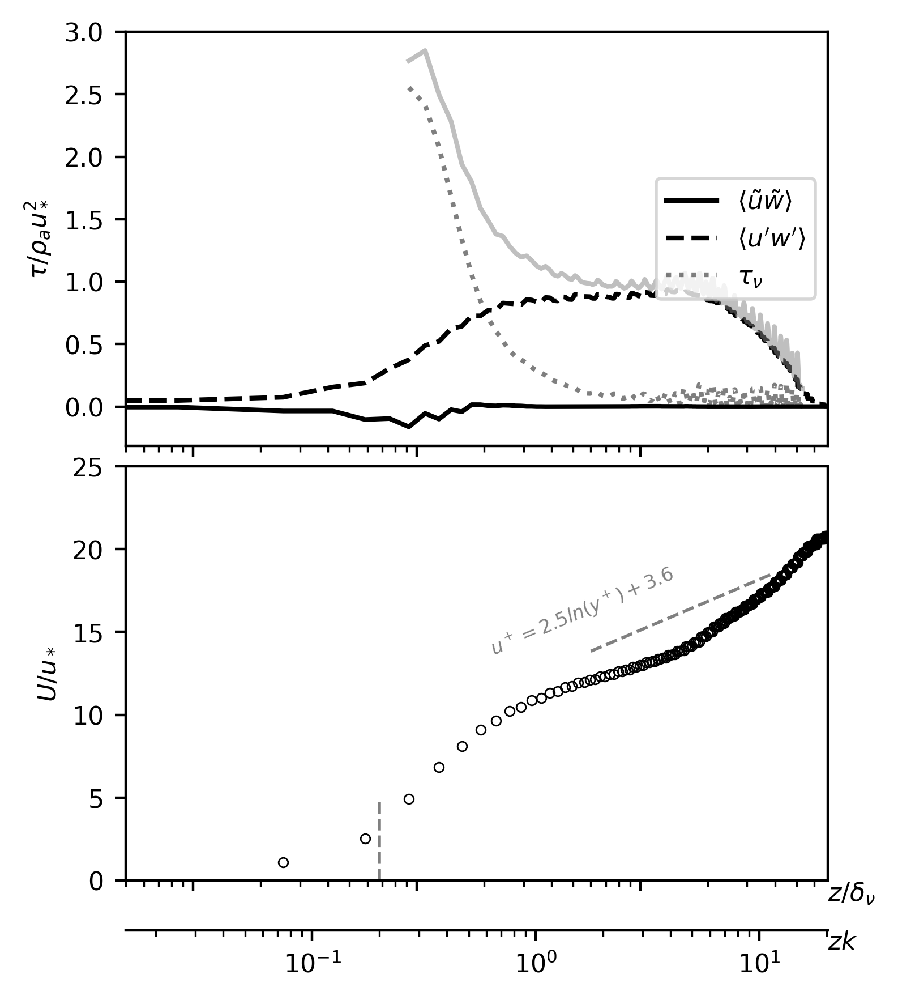

In [41]:
""" Plot the 1D profile along z
    Link with the two scales yk nad y/ytau 
    for the PRECURSOR cases
"""

plt.figure(figsize=[4,7.5])

color = 'k'

""" Stress quantities. """
ax1 = plt.subplot(311)
ax1.set_ylabel(r"$\tau/\rho_a u_*^2$")
plt.setp(ax1.get_xticklabels(), visible=False)

range1 = 87; range2 = 400

def plot_stress (case, color):
    plt.plot((case.yarray-case.h)/case.ytau, -np.average(case.wavestress_2D, axis=0), color=color, label = r'$\langle\tilde{u}\tilde{w}\rangle$')
    plt.plot((case.yarray-case.h)/case.ytau, -np.average(case.turbstress_2D_from3D, axis=0), '--', color=color, label = r'$\langle u^{\prime}w^{\prime}\rangle$')
    # Compute the viscous shear stress
    ux_simu = (np.average(case.ux_2D_horizaver, axis=0))/case.ustar
    ux_smooth = butter_lowpass_filter(ux_simu[range1:range2], CUT=16, N=512)
    grad = np.gradient(ux_smooth)/(case.L0/case.N)
    tau_nu = grad*case.mu2/case.tau0
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, tau_nu, ':', color=color, alpha = 0.5, label=r'$\tau_{\nu}$') # r'$|U(y)^{\prime}/kU||$'
    plt.plot((case.yarray-case.h)[range1:range2]/case.ytau, -np.average(case.wavestress_2D+case.turbstress_2D_from3D, axis=0)[range1:range2]+tau_nu, color='gray', alpha=0.5)
    return ((case.yarray-case.h)/case.ytau, -np.average(case.wavestress_2D, axis=0), -np.average(case.turbstress_2D_from3D, axis=0), np.average(case.ux_2D_horizaver, axis=0)/0.25, (case.yarray[range1:range2]-1)/case.ytau, tau_nu)

case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
case.ytau = (2*np.pi-case.h)/case.Retau; case.tau0 = case.rho2*case.ustar**2
a1,a2,a3,a4,a5,a6 = plot_stress(case, color)


def plot_velocity (case, color, range1, range2):
    """ Plot velocity and two time scales Te and Ta. """
    plt.plot((case.yarray[31:-1:2]-case.h)/case.ytau, np.average(case.ux_2D_horizaver, axis=0)[31:-1:2]/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
#     plt.plot((case.yarray[range1:range2:2]-case.h)/case.ytau, (case.yarray[range1:range2:2]-case.h)/case.ustar*np.pi/0.41, color='gray', alpha=0.5) # T_e = (\pi/\kappa)y/u_*
#     plt.plot((case.yarray[range1:range2:2]-case.h)/case.ytau, (case.yarray[range1:range2:2]-case.h)/case.ustar, color='gray', alpha=0.5) # Alternative def of T_e = y/\bar{u}(y)
#     plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, 2*np.pi/((np.average(case.ux_2D_horizaver, axis=0)[range1:range2]-case.wave.c)*case.k), color=color, alpha=0.5) # T_a = \lambda/(\bar{u}(y)-c)
    
def plot_gradient (case, color, range1, range2):
    """ Plot the gradient of the meant, required to compute medium layer height.
        Also helps to compute viscous stress. """
    plt.plot((case.yarray-case.h)/case.ytau, (np.average(case.ux_2D_horizaver, axis=0))/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
    ux_simu = (np.average(case.ux_2D_horizaver, axis=0))/case.ustar
    ux_smooth = butter_lowpass_filter(ux_simu[range1:range2], CUT=8, N=512)
    # plt.plot((case.yarray[start:-1]-case.h)/ytau, ux_simu)
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, ux_smooth, color=color, alpha=0.5)
#     quant = np.gradient(ux_smooth)/(case.L0/case.N)/(ux_smooth-case.wave.c)/case.k 
#     plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, quant, '--', color=color, alpha = 0.5) # r'$|U(y)^{\prime}/kU||$'
    grad = np.gradient(ux_smooth)/(case.L0/case.N)/case.k
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, grad, '--', color=color, alpha = 0.5, label=r'$U^{\prime}/k$') # r'$|U(y)^{\prime}/kU||$'
    curv = np.gradient(grad)/(case.L0/case.N)/case.k**2
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, curv, ':', color=color, alpha = 0.5, label=r'$U^{\prime\prime}/k^2$')     
#     plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, (case.yarray[range1:range2]-case.h)*case.k/case.ustar, color='gray', alpha=0.5) # r'$ky$'

ax2 = plt.subplot(312, sharex=ax1)
plt.setp(ax2.get_xticklabels(), visible=False)
plot_velocity(case, color, range1, 400)

ax2.set_ylabel(r'$U/u_*$')
ax2.set_ylim([0, 25])
y = np.ones(20)*case.ak/case.k/case.ytau
ax2.plot(y, np.linspace(0,5,20), '--', color='gray', lw=1)
y = np.arange(60,400)
ax2.plot(y, 1/0.4*np.log(y)+3.6, '--', color='gray', lw=1)
ax2.text(0.65, 0.65, r'$u^+=2.5ln(y^+)+3.6$', ha='center', va='center', rotation=23, fontsize=6,
        color='gray', transform=ax2.transAxes)



""" Formatting the axes. """
# plt.xlim([0.5, 200])
plt.xscale('log')
plt.xlim([0.5, 690])
ax2.annotate(r'$z/\delta_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')
# plt.legend(loc='upper left')

def forward(x):
    return x*case.ytau*case.k
def back(x):
    return x/case.k/case.ytau

secax_x2 = ax2.secondary_xaxis(-0.12, functions=(forward, back))
ax2.annotate(r'$zk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')


filename = 'Stats/stress_CU%.0f.csv' %0
with open(filename,'w') as f:
    f.write('z+,tau_wave,tau_Reynolds,u+\n')
    np.savetxt(f, np.array(list(zip(a1,a2,a3,a4))), delimiter=',', fmt='%f')
filename = 'Stats/viscous_CU%.0f.csv' %0
with open(filename,'w') as f:
    f.write('z+subset,tau_nu\n')
    np.savetxt(f, np.array(list(zip(a5,a6))), delimiter=',', fmt='%f')


plt.subplots_adjust(wspace=0, hspace=0.05)
ax1.legend(loc='center right')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


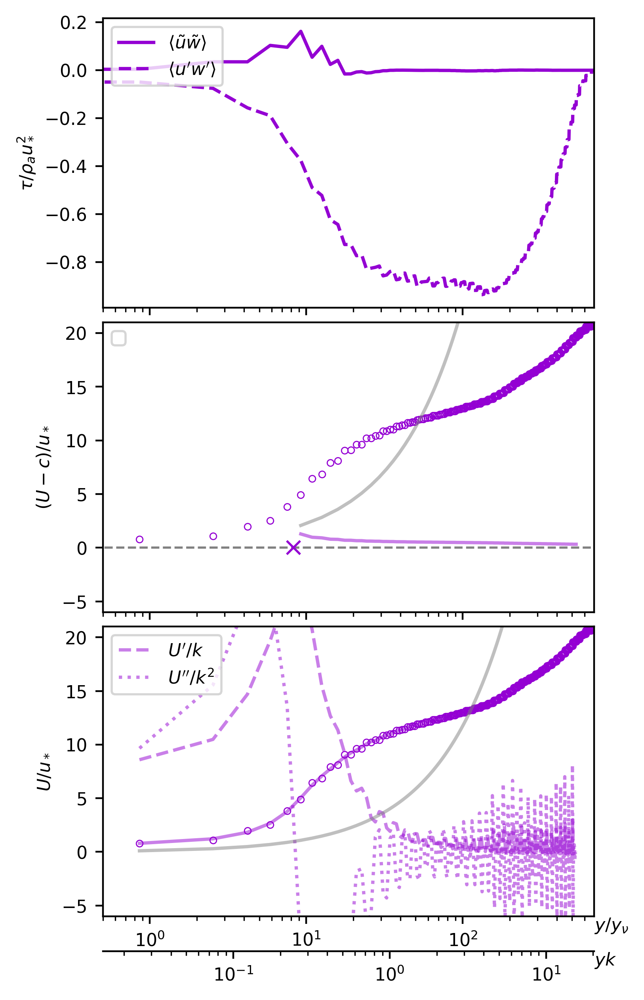

In [38]:
""" An order version of code

    Plot the 1D profile along z
    Link with the two scales yk nad y/ytau 
    for the PRECURSOR cases
"""

plt.figure(figsize=[4,7.5])

""" Stress quantities. """
ax1 = plt.subplot(311)
plt.setp(ax1.get_xticklabels(), visible=False)
plt.ylabel(r"$\tau/\rho_a u_*^2$")

def plot_stress (case, color):
    case.wavestress_2D = (case.uy_2D_phaseaver-case.uy_2D_horizaver)*(case.ux_2D_phaseaver-case.ux_2D_horizaver)/0.25**2*(1-case.f_2D[0])
    case.turbstress_2D = np.average((case.uy_2D-np.tile(case.uy_2D_phaseaver, (frame,1,1)))*(case.ux_2D-np.tile(case.ux_2D_phaseaver, (frame,1,1))), axis=0)/0.25**2*(1-case.f_2D[0])
    plt.plot((case.yarray-case.h)/case.ytau, np.average(case.wavestress_2D, axis=0), color=color, label = r'$\langle\tilde{u}\tilde{w}\rangle$')
    plt.plot((case.yarray-case.h)/case.ytau, np.average(case.turbstress_2D_from3D, axis=0), '--', color=color, label = r'$\langle u^{\prime}w^{\prime}\rangle$')
#     plt.plot((case.yarray-1)/case.ytau, np.average(quant1+quant2, axis=0), ':', color=color)

case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
case.ytau = (2*np.pi-1)/case.Retau
plot_stress(case, 'darkviolet')
# for (case, color) in zip((case4,case5,case6),('magenta','darkviolet','blue')):
#     case.yarray = np.linspace(0,case.L0,case.N,endpoint=False)+case.L0/2**case.N/2
#     case.ytau = (2*np.pi-1)/case.Retau
#     plot_stress(case, color)

""" Flow field quantities. """

def plot_velocity (case, color, range1, range2):
    """ Plot velocity and two time scales Te and Ta. """
    plt.plot((case.yarray-case.h)/case.ytau, (np.average(case.ux_2D_horizaver, axis=0))/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
    plt.plot((case.yarray[range1:range2:2]-case.h)/case.ytau, (case.yarray[range1:range2:2]-1)/case.ustar*np.pi/0.41, color='gray', alpha=0.5) # T_e = (\pi/\kappa)y/u_*
#     plt.plot((case.yarray[range1:range2:2]-1)/case.ytau, (case.yarray[range1:range2:2]-1)/case.ustar, color='gray', alpha=0.5) # Alternative def of T_e = y/\bar{u}(y)
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, 2*np.pi/((np.average(case.ux_2D_horizaver, axis=0)[range1:range2])*case.k), color=color, alpha=0.5) # T_a = \lambda/(\bar{u}(y)-c)
    plt.ylim([-2, 23])
    plt.plot((case.yarray-case.h)/case.ytau, 0*(case.yarray-case.h)/case.ytau, '--', color='gray', lw=1)
    
def plot_gradient (case, color, range1, range2):
    """ Plot the gradient of the meant, required to compute medium layer height.
        Also helps to compute viscous stress. """
    plt.plot((case.yarray-case.h)/case.ytau, (np.average(case.ux_2D_horizaver, axis=0))/0.25, 
              marker = 'o', mfc='none', markeredgewidth=0.5, markersize=3, linewidth=0, color=color)
    ux_simu = (np.average(case.ux_2D_horizaver, axis=0))/case.ustar
    ux_smooth = butter_lowpass_filter(ux_simu[range1:range2], CUT=32, N=512)
    # plt.plot((case.yarray[start:-1]-1)/ytau, ux_simu)
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, ux_smooth, color=color, alpha=0.5)
#     quant = np.gradient(ux_smooth)/(case.L0/case.N)/(ux_smooth-case.wave.c)/case.k 
#     plt.plot((case.yarray[range1:range2]-1)/case.ytau, quant, '--', color=color, alpha = 0.5) # r'$|U(y)^{\prime}/kU||$'
    grad = np.gradient(ux_smooth)/(case.L0/case.N)/case.k
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, grad, '--', color=color, alpha = 0.5, label=r'$U^{\prime}/k$') # r'$|U(y)^{\prime}/kU||$'
    curv = np.gradient(grad)/(case.L0/case.N)/case.k**2
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, curv, ':', color=color, alpha = 0.5, label=r'$U^{\prime\prime}/k^2$')     
    plt.plot((case.yarray[range1:range2]-case.h)/case.ytau, (case.yarray[range1:range2]-1)*case.k/case.ustar, color='gray', alpha=0.5) # r'$ky$'

ax2 = plt.subplot(312, sharex=ax1)
plt.setp(ax2.get_xticklabels(), visible=False)
range1 = 87
plot_velocity(case, 'darkviolet', range1, 400)
# for (case, color, range1) in zip((case4,case5,case6),('magenta','darkviolet','blue'), (86, 87, 92)):
#     plot_velocity(case, color, range1, 620)
ax2.plot(8.3,0,'x', color='darkviolet')
ax2.set_ylabel(r'$(U-c)/u_*$')
ax2.set_ylim([-6, 21])
    
ax3 = plt.subplot(313, sharex=ax1)
range1 = 82
plot_gradient(case, 'darkviolet', range1, 400)
# for (case, color, range1) in zip((case4,case5,case6),('magenta','darkviolet','blue'), (82, 82, 83)):
#     plot_gradient(case, color, range1, 400)
ax3.set_ylabel(r'$U$')
ax3.set_ylim([-6, 21])

""" TODO: Miles' quantities """

""" Roughness length"""
# y = np.arange(0.01,400)
# plt.plot(y, 1/0.4*np.log(y)+1, color='green', alpha=0.5)
# ax.annotate(r'$z_0$', xy=(0.2,0.05), ha='left', va='top', xycoords='axes fraction', color='green')

""" Formatting the axes. """
plt.xscale('log')
plt.xlim([0.5, 690])
ax3.annotate(r'$y/y_{\nu}$', xy=(1, 0), ha='left', va='top', xycoords='axes fraction')
ax3.set_ylabel(r'$U/u_*$') 
# plt.legend(loc='upper left')

def forward(x):
    return x*case.ytau*case.k
def back(x):
    return x/case.k/case.ytau

secax_x2 = ax3.secondary_xaxis(-0.12, functions=(forward, back))
ax3.annotate(r'$yk$', xy=(1, -0.12), ha='left', va='top', xycoords='axes fraction')

plt.subplots_adjust(wspace=0, hspace=0.05)
ax1.legend(loc='upper left')
ax2.legend(loc='upper left')
ax3.legend(loc='upper left')

### <a class="anchor" id="4">Rms velocity (TODO)</a>
[back](#0)